# Houston PM2.5 Prediction from MERRA-2 Data

All of this data is from MERRA-2. The data products were in separate files for separate days. I used a different script to combine all of the data into one file so that analysis in this file could focus on the data, rather than manipulating the files.

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import xarray as xr
import geopandas
import pyproj
import rasterio
from rasterio.plot import show as rioshow
from pandas.plotting import scatter_matrix
from sklearn import preprocessing
from sklearn.pipeline import make_pipeline
from sklearn.metrics import mean_squared_error

In [2]:
with xr.open_dataset('data/MERRA-2/merged.nc4') as ds:
    ds.load()
df = ds.to_dataframe()
df.index.set_names(['lat', 'lon', 'Date'], inplace=True)
df['PM2.5'] = df['PM2.5'] * 1e9
df

SSSMASS25  DUSCATAU  BCSCATAU  DUEXTTAU   BCFLUXU  \
lat  lon     Date                                                               
27.5 -97.500 2015-01-01  1.929910e-09  0.001560  0.002431  0.001664  0.000004   
             2015-01-02  1.398983e-09  0.001476  0.003116  0.001572  0.000006   
             2015-01-03  7.728337e-10  0.001717  0.002361  0.001830  0.000009   
             2015-01-04  9.810147e-10  0.005071  0.001328  0.005431  0.000006   
             2015-01-05  3.119860e-09  0.002209  0.001528  0.002350  0.000003   
...                               ...       ...       ...       ...       ...   
32.5 -91.875 2020-12-27  1.103539e-09  0.004158  0.001017  0.004435  0.000005   
             2020-12-28  1.144227e-09  0.005018  0.001723  0.005368  0.000007   
             2020-12-29  4.230147e-10  0.003823  0.001744  0.004084  0.000004   
             2020-12-30  2.255502e-09  0.001949  0.001303  0.002082  0.000006   
             2020-12-31  3.794760e-09  0.001723  0.002165  0.001838  0.000006   

                              OCFLUXV  BCANGSTR   SUFLUXV       SSSMASS  \
lat  lon     Date                                                         
27.5 -97.500 2015-01-01  2.109124e-05  1.539294  0.000007  1.594830e-08   
             2015-01-02  5.719697e-05  1.497134  0.000081  6.315156e-09   
             2015-01-03  5.083041e-05  1.462451  0.000108  3.319087e-09   
             2015-01-04  9.259511e-06  1.428846 -0.000008  5.571303e-09   
             2015-01-05  1.278824e-05  1.458938  0.000008  2.227582e-08   
...                               ...       ...       ...           ...   
32.5 -91.875 2020-12-27  1.379185e-05  1.413061  0.000008  5.143933e-09   
             2020-12-28  6.057778e-07  1.455695  0.000003  5.762544e-09   
             2020-12-29  1.668398e-05  1.450341  0.000033  1.945764e-09   
             2020-12-30  3.856315e-05  1.450040  0.000039  1.237178e-08   
             2020-12-31  5.511900e-05  1.496634  0.000060  1.803924e-08   

                              OCSMASS  ...            SLP        TQV  \
lat  lon     Date                      ...                             
27.5 -97.500 2015-01-01  1.090845e-09  ...  102362.734375  34.891560   
             2015-01-02  1.088885e-09  ...  101865.828125  33.353931   
             2015-01-03  1.363154e-09  ...  101606.859375  29.238062   
             2015-01-04  1.100944e-09  ...  102456.515625  11.435887   
             2015-01-05  5.114070e-10  ...  103517.070312  15.401300   
...                               ...  ...            ...        ...   
32.5 -91.875 2020-12-27  4.931962e-09  ...  101882.445312  10.195582   
             2020-12-28  1.469971e-09  ...  102224.921875  22.448105   
             2020-12-29  1.648802e-09  ...  102498.039062  19.456648   
             2020-12-30  1.568662e-09  ...  101746.492188  24.896044   
             2020-12-31  1.415541e-09  ...  101416.195312  34.190285   

                              V2M     TROPQ      V10M      U50M      U10M  \
lat  lon     Date                                                           
27.5 -97.500 2015-01-01 -4.906837  0.000014 -6.401117 -1.040568 -0.583242   
             2015-01-02 -2.013163  0.000004 -2.569824  1.499022  1.378516   
             2015-01-03 -1.764241  0.000006 -2.303708  3.865480  3.092033   
             2015-01-04 -3.088592  0.000018 -4.104443  0.783023  0.458247   
             2015-01-05 -3.853312  0.000016 -5.023897 -2.091863 -1.499263   
...                           ...       ...       ...       ...       ...   
32.5 -91.875 2020-12-27  2.922699  0.000005  4.705240  1.296834  0.679608   
             2020-12-28  0.498021  0.000003  0.997802  2.126305  0.939887   
             2020-12-29  0.287038  0.000003  0.354689 -3.888931 -2.404750   
             2020-12-30  2.724511  0.000014  4.223238 -1.892775 -1.171457   
             2020-12-31 -2.022713  0.000013 -2.763136 -3.121873 -2.404983   

                             QV2M        TROPPV     QV10M  

This data spans are large square that contains much of Texas. Let's look at the PM2.5 values of one day. Then, we will pare the data down to only the area surrounding Houston.

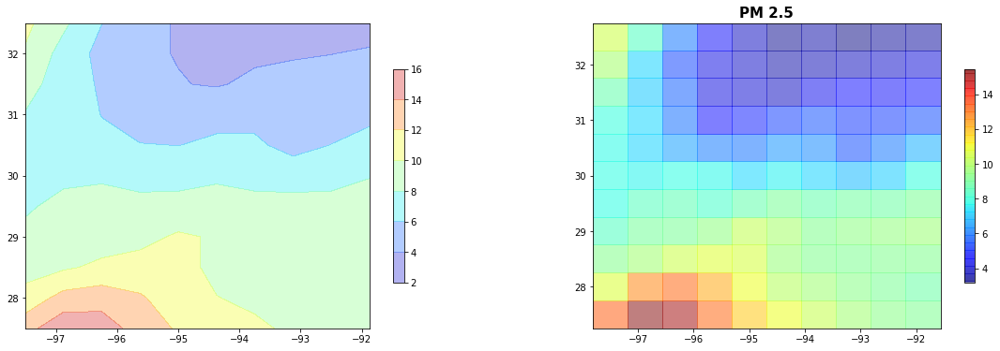

In [3]:
fig, (ax1, ax2) = plt.subplots(1, 2 , figsize=(20,6))

group = df.reset_index(['lat', 'lon']).loc['2015-01-01'].reset_index()
gdf = geopandas.GeoDataFrame(group, geometry=geopandas.points_from_xy(group.lon, group.lat), crs="EPSG:4326")

gdf = gdf[['lat', 'lon', 'PM2.5']]

pivot = gdf.pivot('lat', 'lon')

X=pivot.columns.levels[1].values
Y=pivot.index.values
Z=pivot.values

Xi,Yi = np.meshgrid(X, Y)

color1 = ax1.contourf(Xi, Yi, Z, alpha=0.3, cmap=plt.cm.jet)
color2 = ax2.pcolor(Xi, Yi, Z, shading='auto', alpha=0.5, cmap=plt.cm.jet)

fig.colorbar(color1, ax=ax1, shrink=.7)
fig.colorbar(color2, ax=ax2, shrink=.7)

ax1.set_aspect('equal', adjustable='box')
ax2.set_aspect('equal', adjustable='box')

plt.title(f'PM 2.5', fontsize=15,fontweight='bold')

plt.show();

In [4]:
df = df.reset_index()
north, south, east, west = (30.5, 29, -94.5, -96)
filt = (df['lat'] > south) & (df['lat'] < north) & (df['lon'] > west) & (df['lon'] < east)
df = df[filt]
df = df.set_index(['lat', 'lon', 'Date'])
df

SSSMASS25  DUSCATAU  BCSCATAU  DUEXTTAU   BCFLUXU  \
lat  lon     Date                                                               
29.5 -95.625 2015-01-01  4.533399e-10  0.002021  0.002087  0.002156  0.000004   
             2015-01-02  6.423546e-10  0.001370  0.002210  0.001459  0.000005   
             2015-01-03  5.319692e-10  0.001622  0.003452  0.001729  0.000011   
             2015-01-04  9.017004e-10  0.004917  0.001290  0.005263  0.000008   
             2015-01-05  1.128566e-09  0.001995  0.001070  0.002119  0.000004   
...                               ...       ...       ...       ...       ...   
30.0 -95.000 2020-12-27  2.644830e-09  0.004314  0.000919  0.004610  0.000004   
             2020-12-28  2.339227e-09  0.003801  0.000975  0.004061  0.000004   
             2020-12-29  2.954295e-09  0.002281  0.000758  0.002430  0.000004   
             2020-12-30  5.271861e-09  0.001837  0.000935  0.001960  0.000005   
             2020-12-31  6.721552e-09  0.001791  0.002140  0.001916  0.000006   

                          OCFLUXV  BCANGSTR       SUFLUXV       SSSMASS  \
lat  lon     Date                                                         
29.5 -95.625 2015-01-01  0.000019  1.512882  2.873405e-05  2.579083e-09   
             2015-01-02  0.000035  1.496467  5.385778e-05  2.359006e-09   
             2015-01-03  0.000058  1.491463  1.289998e-04  1.997227e-09   
             2015-01-04  0.000015  1.427629 -7.119951e-06  3.131500e-09   
             2015-01-05  0.000009  1.458390  2.218711e-07  7.439844e-09   
...                           ...       ...           ...           ...   
30.0 -95.000 2020-12-27 -0.000003  1.420772  7.387735e-06  1.482370e-08   
             2020-12-28  0.000005  1.430284  1.209378e-05  1.164618e-08   
             2020-12-29  0.000015  1.418531  2.278212e-05  1.622029e-08   
             2020-12-30  0.000028  1.424324  3.799962e-05  2.575367e-08   
             2020-12-31  0.000099  1.457260  1.162713e-04  2.921010e-08   

                              OCSMASS  ...            SLP        TQV  \
lat  lon     Date                      ...                             
29.5 -95.625 2015-01-01  1.319374e-09  ...  102502.109375  33.872681   
             2015-01-02  1.636088e-09  ...  101835.914062  35.265064   
             2015-01-03  2.193741e-09  ...  101459.898438  35.948349   
             2015-01-04  1.731309e-09  ...  102459.328125   8.960220   
             2015-01-05  8.679905e-10  ...  103588.531250   4.468480   
...                               ...  ...            ...        ...   
30.0 -95.000 2020-12-27  7.764622e-10  ...  101785.757812  17.180527   
             2020-12-28  5.282604e-10  ...  102062.609375  21.724472   
             2020-12-29  5.262817e-10  ...  102127.914062  19.218693   
             2020-12-30  4.267248e-10  ...  101397.546875  25.310759   
             2020-12-31  5.914769e-10  ...  100745.156250  37.198097   

                              V2M     TROPQ      V10M      U50M      U10M  \
lat  lon     Date                                                           
29.5 -95.625 2015-01-01 -2.449461  0.000014 -3.480748 -2.715095 -2.106504   
             2015-01-02 -1.914652  0.000012 -2.711771 -1.203307 -0.913161   
             2015-01-03 -1.075062  0.000006 -1.526446  3.363282  2.576123   
             2015-01-04 -2.824340  0.000018 -4.190116  1.659939  1.085879   
             2015-01-05 -2.647162  0.000015 -3.835776 -1.352524 -0.990397   
...                           ...       ...       ...       ...       ...   
30.0 -95.000 2020-12-27  1.702342  0.000003  3.421182 -2.415095 -1.175590   
             2020-12-28  1.224436  0.000004  2.619898 -2.311006 -1.453111   
             2020-12-29  1.293051  0.000003  2.436874 -6.182795 -3.710495   
             2020-12-30  1.794293  0.000002  3.386426 -4.566867 -2.814300   
             2020-12-31  1.812725  0.000005  3.279339 -4.940825 -3.142035   

                             QV2M        TROPPV     QV10M  

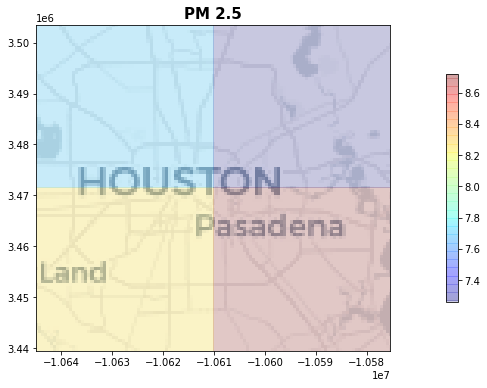

In [5]:
fig, ax = plt.subplots(figsize=(20,6))

group = df.reset_index(['lat', 'lon']).loc['2015-01-01'].reset_index()
gdf = geopandas.GeoDataFrame(group, geometry=geopandas.points_from_xy(group.lon, group.lat), crs="EPSG:4326")
gdf = gdf.to_crs(epsg=3857)

gdf = gdf[['lat', 'lon', 'PM2.5']]
lats = gdf.lat
lons = gdf.lon

transformer = pyproj.Transformer.from_crs("epsg:4326", "epsg:3857")
lats_t, lons_t = transformer.transform(lats, lons)
gdf.lat = lats_t
gdf.lon = lons_t

pivot = gdf.pivot('lon', 'lat')

X=pivot.columns.levels[1].values
Y=pivot.index.values
Z=pivot.values

Xi,Yi = np.meshgrid(X, Y)

c = ax.pcolor(Xi, Yi, Z, shading='auto', alpha=0.2, cmap=plt.cm.jet)

fig.colorbar(c, ax=ax, shrink=.7)

with rasterio.open("houston.tif") as r:
    rioshow(r, ax=ax)

ax.set_aspect('equal', adjustable='box')

ax.set_xlim((np.min(lats_t), np.max(lats_t)))
ax.set_ylim((np.min(lons_t), np.max(lons_t)))

plt.title(f'PM 2.5', fontsize=15,fontweight='bold')

plt.show();

In [6]:
display(df.head())
df.describe()

SSSMASS25  DUSCATAU  BCSCATAU  DUEXTTAU   BCFLUXU  \
lat  lon     Date                                                               
29.5 -95.625 2015-01-01  4.533399e-10  0.002021  0.002087  0.002156  0.000004   
             2015-01-02  6.423546e-10  0.001370  0.002210  0.001459  0.000005   
             2015-01-03  5.319692e-10  0.001622  0.003452  0.001729  0.000011   
             2015-01-04  9.017004e-10  0.004917  0.001290  0.005263  0.000008   
             2015-01-05  1.128566e-09  0.001995  0.001070  0.002119  0.000004   

                          OCFLUXV  BCANGSTR       SUFLUXV       SSSMASS  \
lat  lon     Date                                                         
29.5 -95.625 2015-01-01  0.000019  1.512882  2.873405e-05  2.579083e-09   
             2015-01-02  0.000035  1.496467  5.385778e-05  2.359006e-09   
             2015-01-03  0.000058  1.491463  1.289998e-04  1.997227e-09   
             2015-01-04  0.000015  1.427629 -7.119951e-06  3.131500e-09   
             2015-01-05  0.000009  1.458390  2.218711e-07  7.439844e-09   

                              OCSMASS  ...            SLP        TQV  \
lat  lon     Date                      ...                             
29.5 -95.625 2015-01-01  1.319374e-09  ...  102502.109375  33.872681   
             2015-01-02  1.636088e-09  ...  101835.914062  35.265064   
             2015-01-03  2.193741e-09  ...  101459.898438  35.948349   
             2015-01-04  1.731309e-09  ...  102459.328125   8.960220   
             2015-01-05  8.679905e-10  ...  103588.531250   4.468480   

                              V2M     TROPQ      V10M      U50M      U10M  \
lat  lon     Date                                                           
29.5 -95.625 2015-01-01 -2.449461  0.000014 -3.480748 -2.715095 -2.106504   
             2015-01-02 -1.914652  0.000012 -2.711771 -1.203307 -0.913161   
             2015-01-03 -1.075062  0.000006 -1.526446  3.363282  2.576123   
             2015-01-04 -2.824340  0.000018 -4.190116  1.659939  1.085879   
             2015-01-05 -2.647162  0.000015 -3.835776 -1.352524 -0.990397   

                             QV2M        TROPPV     QV10M  
lat  lon     Date                                          
29.5 -95.625 2015-01-01  0.005170  12385.588867  0.005072  
             2015-01-02  0.006570  11865.560547  0.006467  
             2015-01-03  0.007270  11325.949219  0.007129  
             2015-01-04  0.005313  12323.019531  0.005246  
             2015-01-05  0.003287  13011.084961  0.003148  

[5 rows x 112 columns]

,SSSMASS25,DUSCATAU,BCSCATAU,DUEXTTAU,BCFLUXU,OCFLUXV,BCANGSTR,SUFLUXV,SSSMASS,OCSMASS,...,SLP,TQV,V2M,TROPQ,V10M,U50M,U10M,QV2M,TROPPV,QV10M
count,8.768000e+03,8768.000000,8768.000000,8768.000000,8.768000e+03,8768.000000,8768.000000,8768.000000,8.768000e+03,8.768000e+03,...,8768.000000,8768.000000,8768.000000,8768.000000,8768.000000,8768.000000,8768.000000,8768.000000,8768.000000,8768.000000
mean,4.804019e-09,0.017095,0.002071,0.018242,4.300084e-06,0.000014,1.443080,0.000009,2.421414e-08,2.880524e-09,...,101644.984375,32.013046,0.530144,0.000011,0.861888,-1.177057,-0.790545,0.012958,12992.594727,0.012653
std,5.128774e-09,0.030635,0.001423,0.032630,5.923967e-06,0.000074,0.029746,0.000033,2.639321e-08,3.225033e-09,...,527.719666,13.747928,1.867020,0.000009,2.825848,2.654553,1.800609,0.004778,3117.638184,0.004718
min,1.048483e-11,0.000309,0.000603,0.000327,-4.738612e-05,-0.000651,1.402132,-0.000106,5.327988e-11,2.254478e-10,...,100015.828125,3.730371,-7.510807,0.000002,-9.841187,-14.973824,-11.303222,0.001534,6331.899414,0.001453
25%,1.082839e-09,0.004438,0.001244,0.004742,8.472613e-08,-0.000006,1.419170,-0.000009,5.384370e-09,1.321117e-09,...,101316.095703,20.755805,-0.651665,0.000005,-1.153277,-3.063127,-1.993063,0.009053,10938.776611,0.008806
50%,3.114504e-09,0.008086,0.001679,0.008635,3.599471e-06,0.000006,1.437147,0.000008,1.508555e-08,2.038761e-09,...,101558.972656,33.501787,0.767785,0.000008,1.337072,-1.190459,-0.776268,0.013626,12132.758789,0.013393
75%,6.795575e-09,0.018843,0.002372,0.020117,7.284838e-06,0.000020,1.461278,0.000023,3.409435e-08,3.326562e-09,...,101924.294922,42.648619,1.773365,0.000014,2.899007,0.653717,0.415299,0.017283,14341.666748,0.016914
max,5.138402e-08,0.420442,0.017638,0.447658,4.369943e-05,0.001404,1.558160,0.000247,2.914943e-07,7.147345e-08,...,103971.882812,69.329254,6.818332,0.000159,9.159666,11.069034,9.124202,0.021984,33441.980469,0.021638


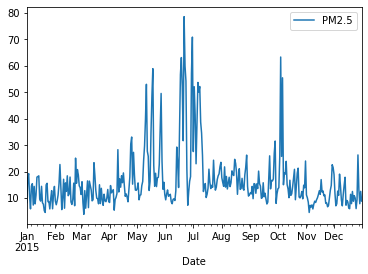

In [7]:
s = df.loc[29.5, -95.625, '2015-01-01':'2015-12-31'].reset_index()[['Date', 'PM2.5']]
s.plot(x='Date');

Now, we have 6 years of data. We will save the data from 2020 for testing and train on the rest of the data.

In [8]:
df = df.reset_index()

train_filt = df['Date'] < '2020-01-01'
test_filt = df['Date'] > '2019-12-31'

train = df[train_filt]
test = df[test_filt]

df = df.set_index(['lat', 'lon', 'Date'])
display(train)

,lat,lon,Date,SSSMASS25,DUSCATAU,BCSCATAU,DUEXTTAU,BCFLUXU,OCFLUXV,BCANGSTR,...,SLP,TQV,V2M,TROPQ,V10M,U50M,U10M,QV2M,TROPPV,QV10M
0,29.5,-95.625,2015-01-01,4.533399e-10,0.002021,0.002087,0.002156,0.000004,0.000019,1.512882,...,102502.109375,33.872681,-2.449461,0.000014,-3.480748,-2.715095,-2.106504,0.005170,12385.588867,0.005072
1,29.5,-95.625,2015-01-02,6.423546e-10,0.001370,0.002210,0.001459,0.000005,0.000035,1.496467,...,101835.914062,35.265064,-1.914652,0.000012,-2.711771,-1.203307,-0.913161,0.006570,11865.560547,0.006467
2,29.5,-95.625,2015-01-03,5.319692e-10,0.001622,0.003452,0.001729,0.000011,0.000058,1.491463,...,101459.898438,35.948349,-1.075062,0.000006,-1.526446,3.363282,2.576123,0.007270,11325.949219,0.007129
3,29.5,-95.625,2015-01-04,9.017004e-10,0.004917,0.001290,0.005263,0.000008,0.000015,1.427629,...,102459.328125,8.960220,-2.824340,0.000018,-4.190116,1.659939,1.085879,0.005313,12323.019531,0.005246
4,29.5,-95.625,2015-01-05,1.128566e-09,0.001995,0.001070,0.002119,0.000004,0.000009,1.458390,...,103588.531250,4.468480,-2.647162,0.000015,-3.835776,-1.352524,-0.990397,0.003287,13011.084961,0.003148
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8397,30.0,-95.000,2019-12-27,7.382859e-10,0.001824,0.001288,0.001945,0.000003,0.000014,1.446103,...,101798.367188,22.611849,0.281974,0.000017,0.595089,-3.374161,-1.941880,0.009877,15260.861328,0.009749
8398,30.0,-95.000,2019-12-28,1.047435e-09,0.001230,0.001167,0.001311,0.000004,0.000029,1.460357,...,101186.671875,33.345982,1.597403,0.000015,3.027991,-3.991869,-2.189558,0.012351,14747.486328,0.012309
8399,30.0,-95.000,2019-12-29,2.354526e-09,0.004388,0.001399,0.004729,0.000007,0.000026,1.481993,...,100845.296875,33.176529,0.568140,0.000034,0.974060,2.750433,1.689226,0.011685,16669.802734,0.011597
8400,30.0,-95.000,2019-12-30,3.740913e-10,0.007175,0.000868,0.007686,0.000009,0.000003,1.402589,...,101881.031250,6.611993,-1.192074,0.000013,-2.458483,3.200467,1.736222,0.004265,12679.042969,0.004034


Now, the columns we want are these:
 - Surface pressure (PS)
 - 2- and 10-meter specific humidity (QV10M, QV2M)
 - 2- and 10-meter air temperature (T10M, T2M)
 - 2-, 10-, and 50-meter wind components (U10M, U2M, V10M, V2M, U50M, V50M)
 - Total precipitable liquid water (TQL)
 - Total precipitable ice water (TQI)
 - Total precipitable water vapor (TQV)
 - Surface albedo (ALBEDO)
 - Total cloud area fraction (CLDTOT)
 - Surface absorbed longwave radiation (LWGAB)
 - Longwave flux emitted from surface (LWGEM)
 - Surface incoming shortwave flux (SWGDN)
 - PM2.5 (PM2.5)
 - Aerosol Optical Depth Analysis (AODANA)

In [9]:
# features = ['PS', 'QV10M', 'QV2M', 'T10M', 'T2M', 'U10M', 'U2M', 'V10M', 'V2M', 'U50M', 'V50M', 'TQL', 'TQI', 'TQV', 'ALBEDO', 'CLDTOT', 'LWGAB', 'LWGEM', 'SWGDN', 'PM2.5', 'AODANA', 'Date', 'lat', 'lon']
features = ['PS', 'QV2M', 'T2M', 'U2M', 'V2M', 'TQL', 'TQI', 'TQV', 'ALBEDO', 'CLDTOT', 'LWGAB', 'LWGEM', 'SWGDN', 'PM2.5', 'AODANA', 'Date', 'lat', 'lon']
train = train[features]
test = test[features]
display(train.head(2))

,PS,QV2M,T2M,U2M,V2M,TQL,TQI,TQV,ALBEDO,CLDTOT,LWGAB,LWGEM,SWGDN,PM2.5,AODANA,Date,lat,lon
0,102206.734375,0.00517,279.765778,-1.503023,-2.449461,0.178650,0.027982,33.872681,0.142819,0.964355,323.165741,342.105408,55.840008,8.259367,0.140065,2015-01-01,29.5,-95.625
1,101544.734375,0.00657,282.227631,-0.656459,-1.914652,0.174095,0.043295,35.265064,0.149256,0.932393,336.696869,355.167114,70.535767,17.585114,0.206579,2015-01-02,29.5,-95.625


Now, let's pick just one location, 29.5, -95.625, and start working from there.

In [10]:
train = train.set_index(['lat', 'lon']).loc[29.5, -95.625].reset_index()
test = train.set_index(['lat', 'lon']).loc[29.5, -95.625].reset_index()
display(train.head(2))
display(test.head(2))

,lat,lon,PS,QV2M,T2M,U2M,V2M,TQL,TQI,TQV,ALBEDO,CLDTOT,LWGAB,LWGEM,SWGDN,PM2.5,AODANA,Date
0,29.5,-95.625,102206.734375,0.00517,279.765778,-1.503023,-2.449461,0.178650,0.027982,33.872681,0.142819,0.964355,323.165741,342.105408,55.840008,8.259367,0.140065,2015-01-01
1,29.5,-95.625,101544.734375,0.00657,282.227631,-0.656459,-1.914652,0.174095,0.043295,35.265064,0.149256,0.932393,336.696869,355.167114,70.535767,17.585114,0.206579,2015-01-02


,lat,lon,PS,QV2M,T2M,U2M,V2M,TQL,TQI,TQV,ALBEDO,CLDTOT,LWGAB,LWGEM,SWGDN,PM2.5,AODANA,Date
0,29.5,-95.625,102206.734375,0.00517,279.765778,-1.503023,-2.449461,0.178650,0.027982,33.872681,0.142819,0.964355,323.165741,342.105408,55.840008,8.259367,0.140065,2015-01-01
1,29.5,-95.625,101544.734375,0.00657,282.227631,-0.656459,-1.914652,0.174095,0.043295,35.265064,0.149256,0.932393,336.696869,355.167114,70.535767,17.585114,0.206579,2015-01-02


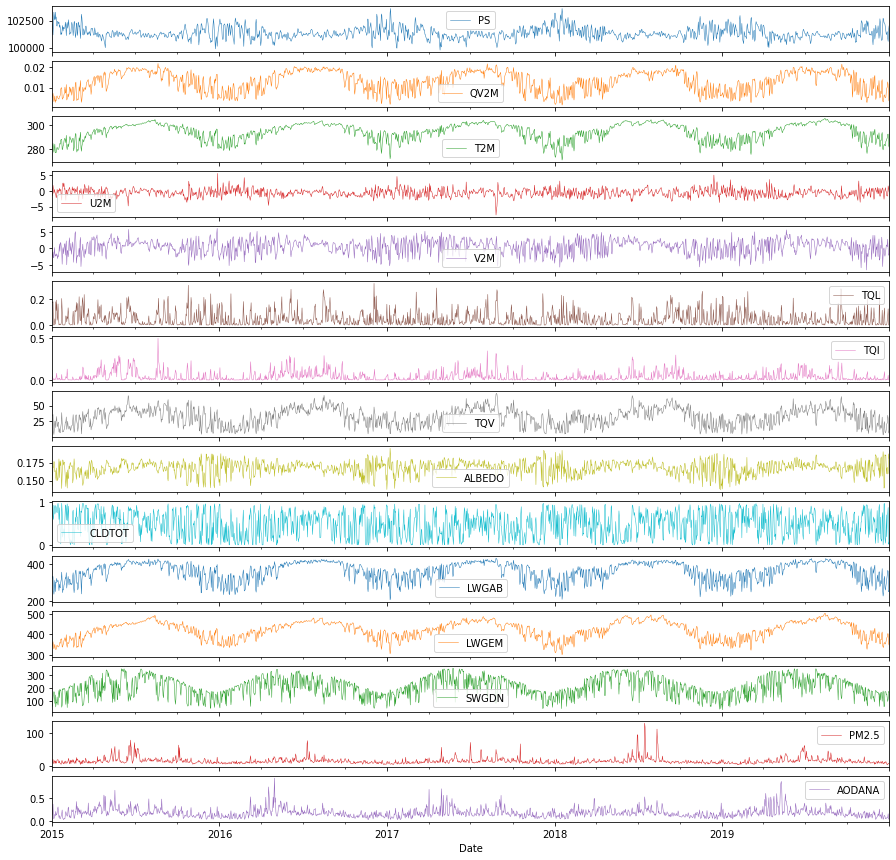

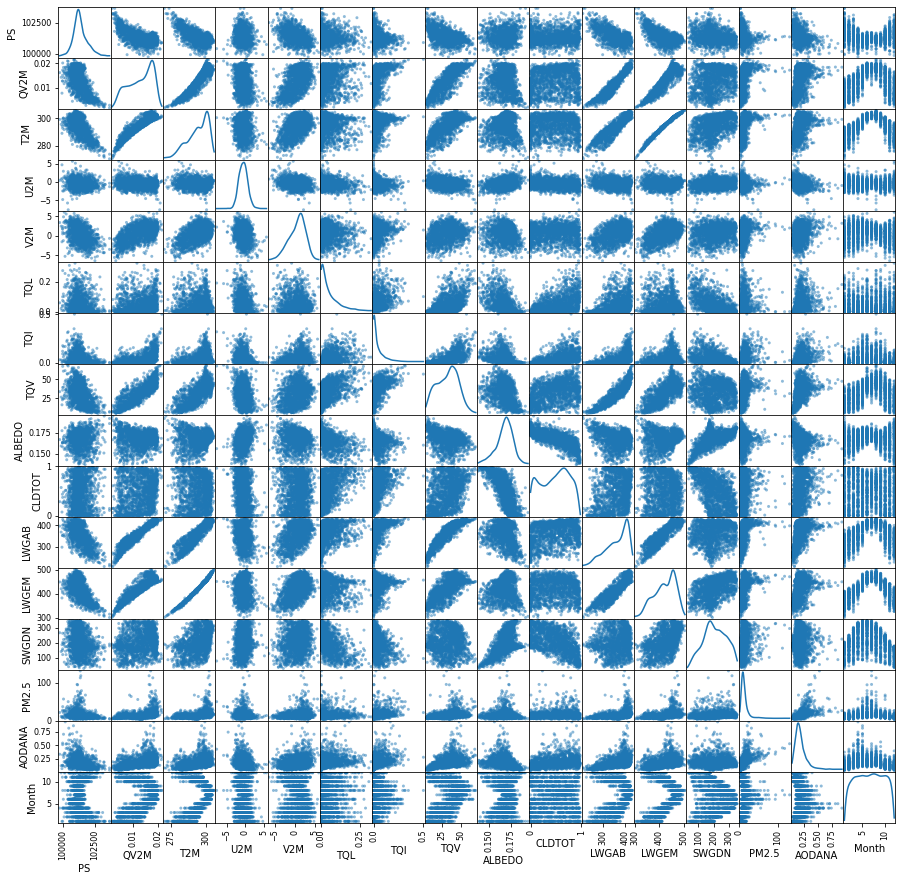

In [11]:
train = train.loc[:, ~train.columns.isin(['lat', 'lon'])]
test = test.loc[:, ~test.columns.isin(['lat', 'lon'])]

train['Month'] = train.Date.dt.month
test['Month'] = test.Date.dt.month

train.set_index('Date', inplace=True)
test.set_index('Date', inplace=True)

train.drop('Month', axis='columns').plot(subplots=True, figsize=(15, 15), lw=.5);
scatter_matrix(train, alpha=.5, figsize=(15, 15), diagonal='kde');

Looking at the values, the scale of each feature is pretty different. Let's normalize them.

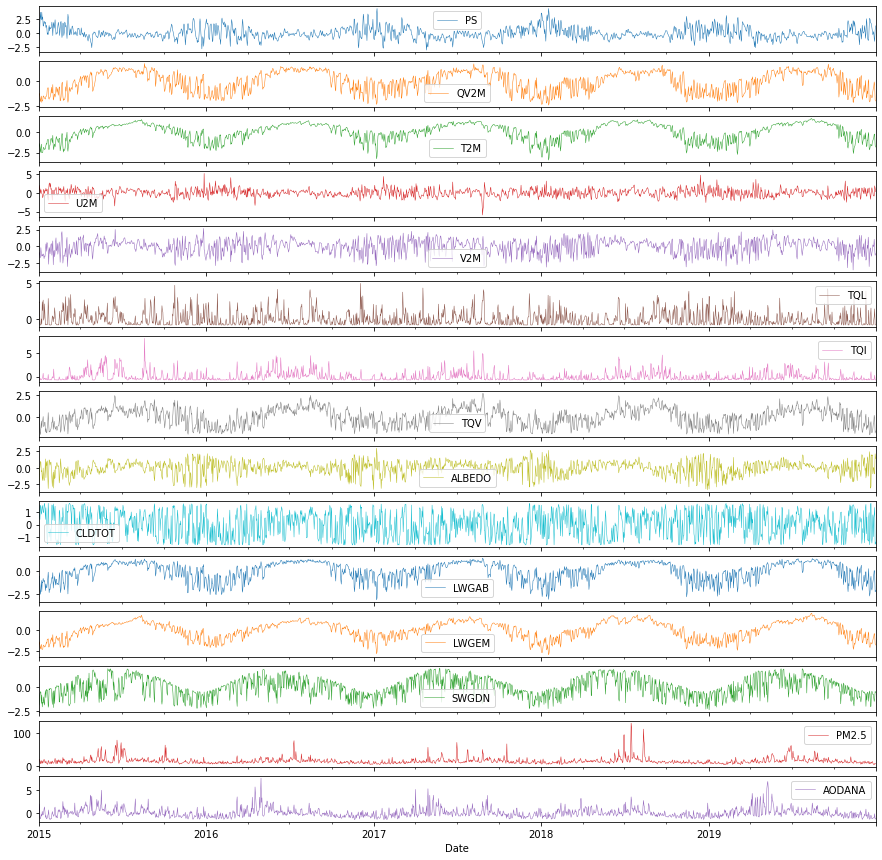

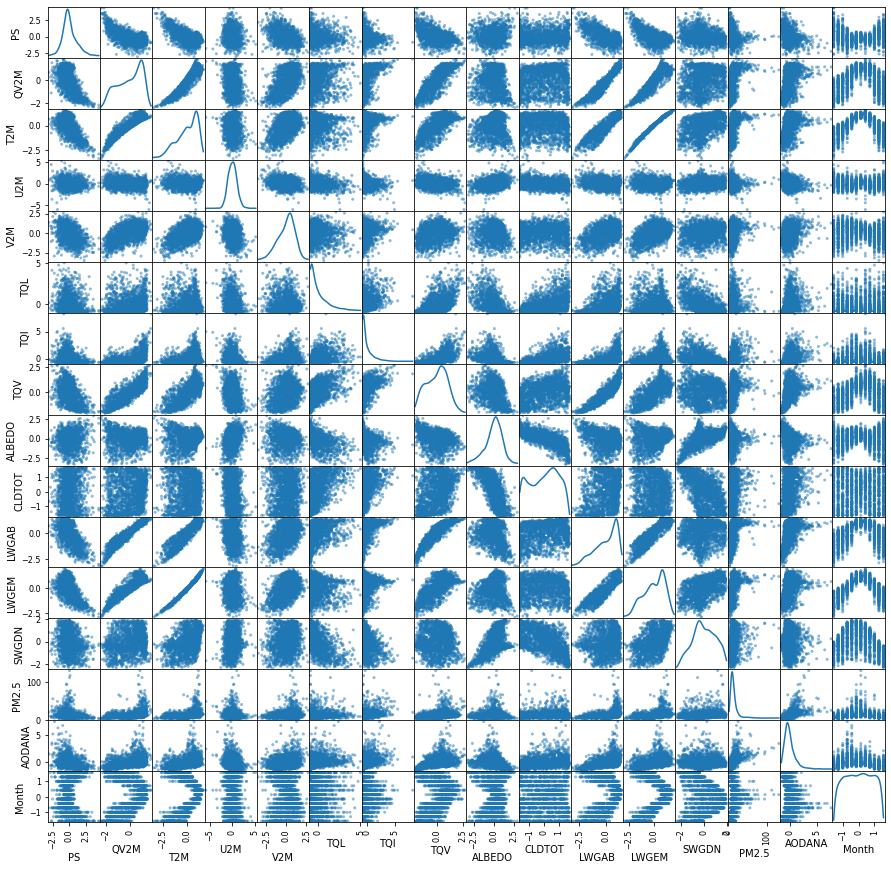

In [12]:
scaler = preprocessing.StandardScaler()

all_but_pm25 = train.columns.drop('PM2.5')
train[all_but_pm25] = scaler.fit_transform(train[all_but_pm25])

train.drop('Month', axis='columns').plot(subplots=True, figsize=(15, 15), lw=.5);
scatter_matrix(train, alpha=.5, figsize=(15, 15), diagonal='kde');

In [13]:
display(train.head(2))
X_train, Y_train = train.drop('PM2.5', axis=1), train['PM2.5']

#now, scale the test
all_but_pm25 = test.columns.drop('PM2.5')
test[all_but_pm25] = scaler.fit_transform(test[all_but_pm25])

X_test, Y_test = test.drop('PM2.5', axis=1), test['PM2.5']

display(X_train.head(2))
display(Y_train.head(2))

,PS,QV2M,T2M,U2M,V2M,TQL,TQI,TQV,ALBEDO,CLDTOT,LWGAB,LWGEM,SWGDN,PM2.5,AODANA,Month
Date,,,,,,,,,,,,,,,,
2015-01-01,1.635940,-1.622291,-2.081653,-0.782645,-1.505967,2.348027,-0.215304,0.119689,-2.716928,1.675260,-0.813325,-1.925828,-2.029596,8.259367,-0.414526,-1.60171
2015-01-02,0.372998,-1.332626,-1.731313,-0.078019,-1.240424,2.266435,0.060344,0.222074,-2.013164,1.565634,-0.538743,-1.612562,-1.832654,17.585114,0.250488,-1.60171


,PS,QV2M,T2M,U2M,V2M,TQL,TQI,TQV,ALBEDO,CLDTOT,LWGAB,LWGEM,SWGDN,AODANA,Month
Date,,,,,,,,,,,,,,,
2015-01-01,1.635940,-1.622291,-2.081653,-0.782645,-1.505967,2.348027,-0.215304,0.119689,-2.716928,1.675260,-0.813325,-1.925828,-2.029596,-0.414526,-1.60171
2015-01-02,0.372998,-1.332626,-1.731313,-0.078019,-1.240424,2.266435,0.060344,0.222074,-2.013164,1.565634,-0.538743,-1.612562,-1.832654,0.250488,-1.60171


Date
2015-01-01     8.259367
2015-01-02    17.585114
Name: PM2.5, dtype: float32

# Preliminary Modelling

Now, we have our training and test sets. Both of have been scaled down (independant of each other to avoid data snooping). We can try to train some models

In [14]:
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor

reg = LinearRegression().fit(X_train, Y_train)
ridge = Ridge(alpha=.5).fit(X_train, Y_train)
randomForest = RandomForestRegressor().fit(X_train, Y_train)
adaBoost = AdaBoostRegressor().fit(X_train, Y_train)

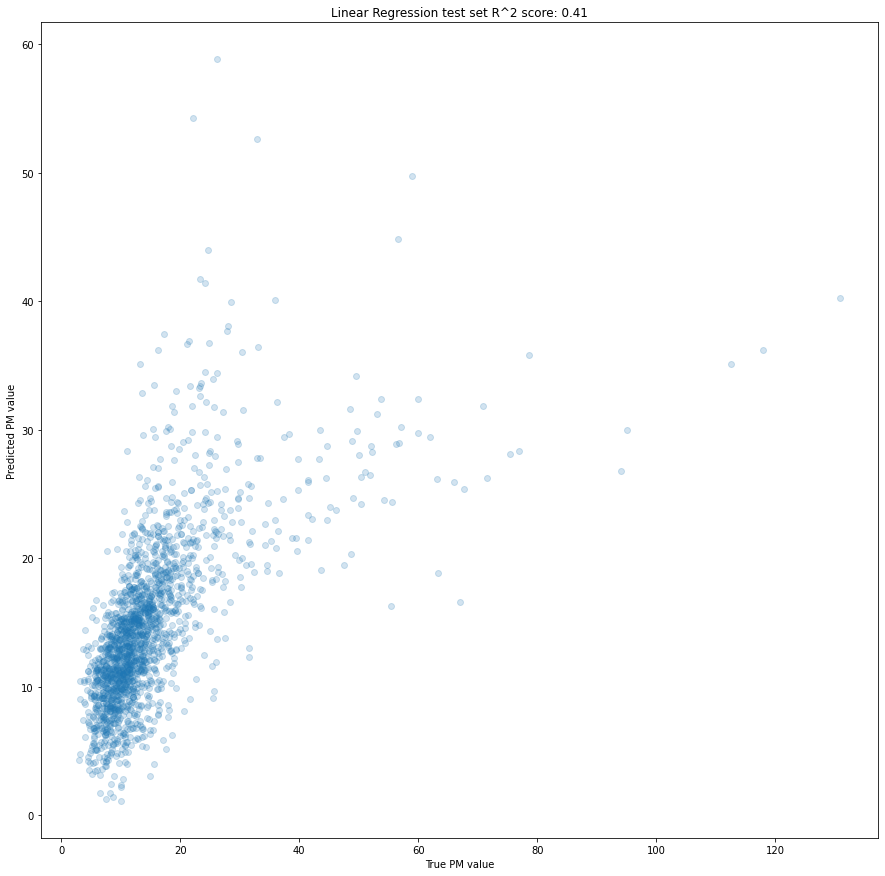

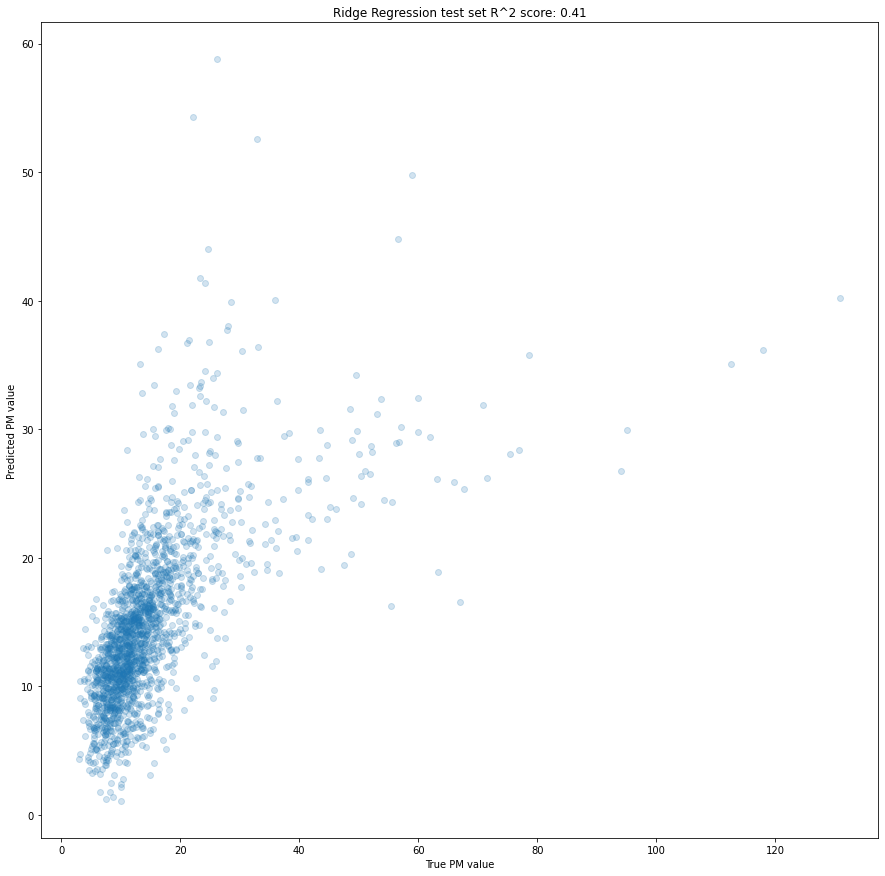

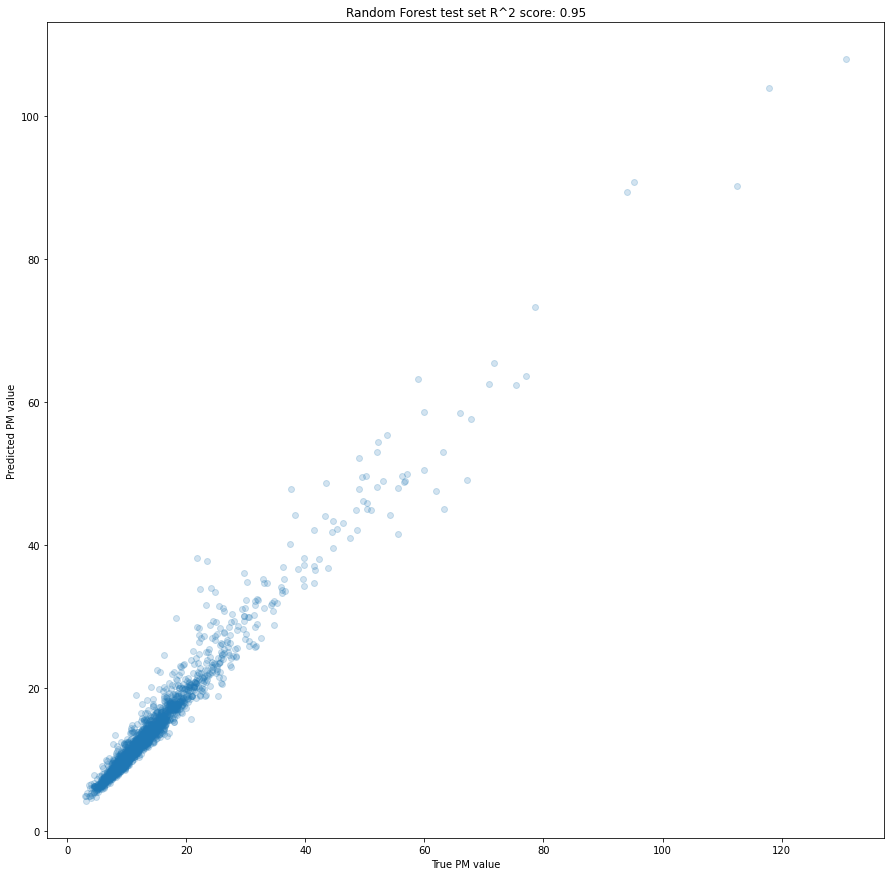

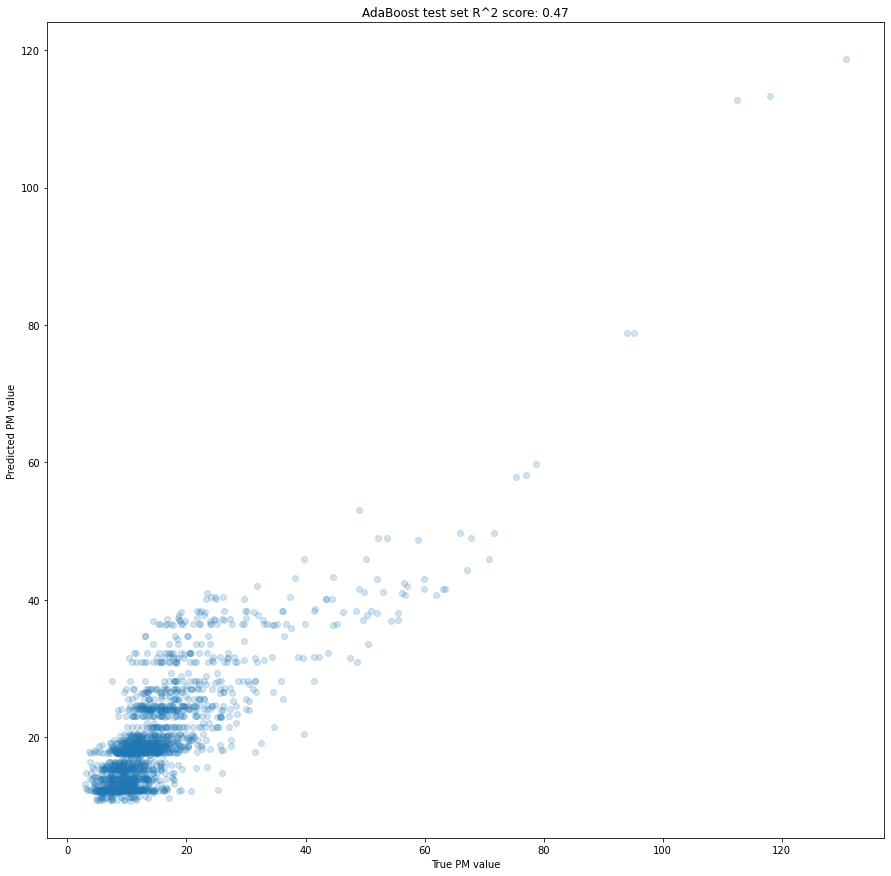

In [15]:
for m, name in [(reg, 'Linear Regression'), (ridge, 'Ridge Regression'), (randomForest, 'Random Forest'), (adaBoost, 'AdaBoost')]:
    y_hat = m.predict(X_train)
    fig, ax = plt.subplots(figsize=(15, 15))
    ax.scatter(Y_train, y_hat, alpha=0.2)
    ax.set_xlabel('True PM value')
    ax.set_ylabel('Predicted PM value')
    ax.set_title(f'{name} test set R^2 score: {m.score(X_train, Y_train):.2f}')
    plt.show();

In [16]:
translations = {'PS': 'Surface pressure',
'QV2M': '2-meter specific humidity',
'QV10M': '10-meter specific humidity',
'T2M': '2-meter air temperature',
'T10M' : '10-meter air temperature',
'U2M': '2-meter eastward wind',
'V2M': '2-meter northward wind',
'U50M': '50-meter eastward wind',
'V50M': '50-meter northward wind',
'U10M': '10-meter eastward wind',
'V10M': '10-meter northward wind',
'TQL': 'Total precipitable liquid water',
'TQI': 'Total precipitable ice water',
'TQV': 'Total precipitable water vapor',
'ALBEDO': 'Surface albedo',
'CLDTOT': 'Total cloud area fraction',
'LWGAB': 'Surface absorbed longwave radiation',
'LWGEM': 'Longwave flux emitted from surface',
'SWGDN': 'Surface incoming shortwave flux',
'PM2.5': 'PM2.5',
'AODANA': 'Aerosol Optical Depth Analysis'
}

In [17]:
def feature_importance(forest, name, columns, ytick_range, fontsize = 10):
    importances = forest.feature_importances_
    std = np.std([tree.feature_importances_ for tree in forest.estimators_],
                 axis=0)
    indices = np.argsort(importances)[::]

    # Plot the impurity-based feature importances of the forest
    fig, ax = plt.subplots(figsize=(15, 15), dpi=200)
    ax.set_title(f"Feature importances for {name}")
    ax.barh(ytick_range, importances[indices],
            color="r", yerr=std[indices], align="center")
    ax.set_yticks(ytick_range)
    ax.set_yticklabels(columns[indices], fontsize=fontsize)
    ax.set_ylim([-1, max(ytick_range)])
    plt.show()

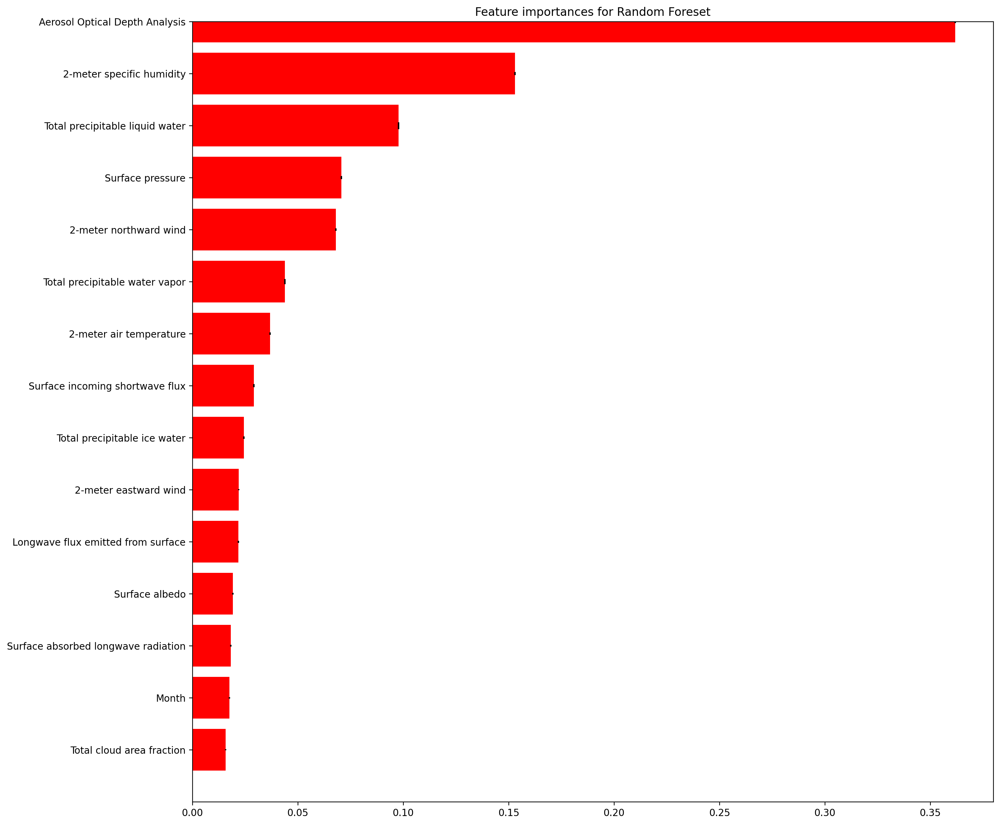

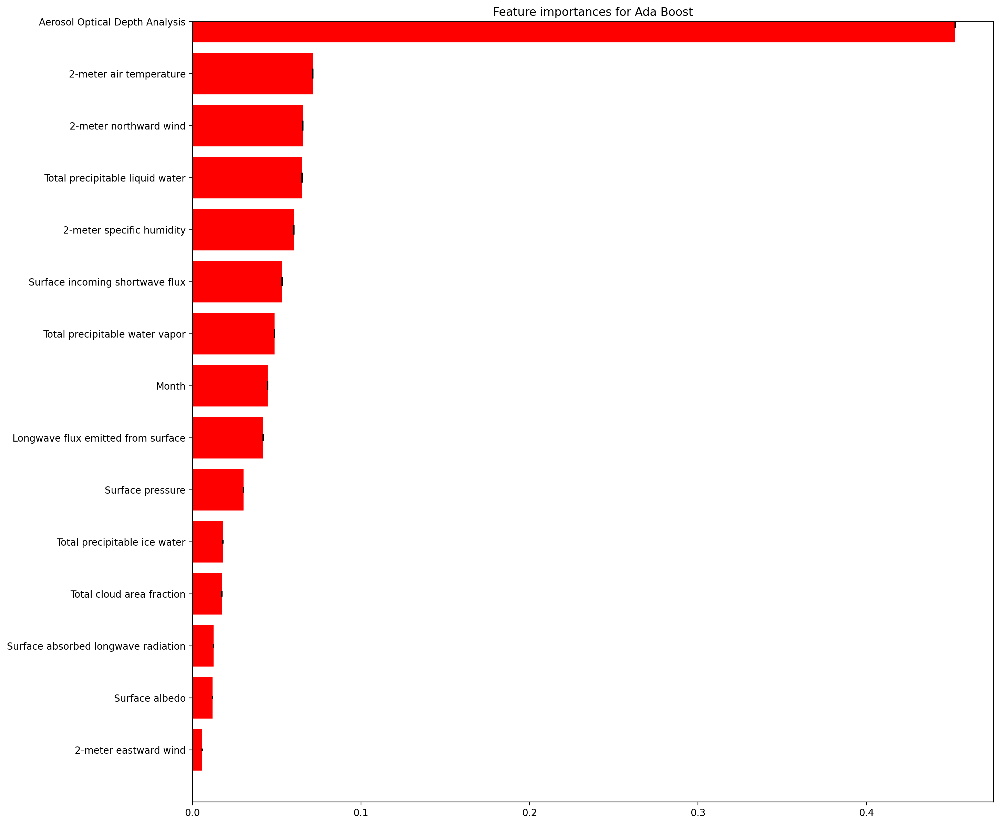

In [18]:
names = np.array([translations[i] if i in translations else i for i in X_train.columns.values])
feature_importance(randomForest, "Random Foreset", names, range(X_train.shape[1]))
feature_importance(adaBoost, "Ada Boost", names, range(X_train.shape[1]))

# 2-15-2021 Update

I met with Dr. Xu to talk about the inital results. After looking at the feature importance plots, and using his own intuition about the physical meaning of some of the variables, we decided to drop these variables:
- longwave flux emitted,
- surface absorbed longwave,
- ice water,
- specific humidity, and
- surface albedo.

We also decided to add the 10-meter winds, since there is probably some dispersion that happens that is correlated to that component.

Further, I standardizes the data, but there may not really have been a real reason to do that. It would also make future predictions sort of hard to do since actual data would not be normalized. I would have to scale that down using some mean and standard deviation of each and that would introduce bias to future data. I will remove the standardization and run everything again.

I am also going to add at least root mean squared error as a performance measure.

I'll also try resmapling the data at 5- or 7-day lengths and run models for those data. 

I will also add PM2.5 as a predictor. If these models are doing what we want, we should see the error measures drop drastically since the thing we are predicting is included in the input. This is not going to be used to do prediction (obiviously), but as a gut check so we can see how the ensemble models are reacitng. If the ensemble models deem the PM2.5 feature useless, then there is clearly something wrong.

It will also be interesting to see how the models work across space. So, this time 4 models will be made for each of the 4 locations. Each model will predict both its location's data and the other three. We will be able to see if the model are learning the data or some more general function.

In [19]:
df = df.reset_index()

train_filt = df['Date'] < '2020-01-01'
test_filt = df['Date'] > '2019-12-31'

train = df[train_filt]
test = df[test_filt]

df = df.set_index(['lat', 'lon', 'Date'])

features = ['PS', 'T2M', 'U2M', 'V2M', 'U10M', 'V10M', 'TQL', 'TQV', 'CLDTOT', 'SWGDN', 'PM2.5', 'AODANA', 'Date', 'lat', 'lon']
train = train[features]
test = test[features]

train['Month'] = train.Date.dt.month
test['Month'] = test.Date.dt.month

train.set_index(['lat', 'lon', 'Date'], inplace=True)
test.set_index(['lat', 'lon', 'Date'], inplace=True)

display(train.head(2))

PS         T2M       U2M       V2M  \
lat  lon     Date                                                        
29.5 -95.625 2015-01-01  102206.734375  279.765778 -1.503023 -2.449461   
             2015-01-02  101544.734375  282.227631 -0.656459 -1.914652   

                             U10M      V10M       TQL        TQV    CLDTOT  \
lat  lon     Date                                                            
29.5 -95.625 2015-01-01 -2.106504 -3.480748  0.178650  33.872681  0.964355   
             2015-01-02 -0.913161 -2.711771  0.174095  35.265064  0.932393   

                             SWGDN      PM2.5    AODANA  Month  
lat  lon     Date                                               
29.5 -95.625 2015-01-01  55.840008   8.259367  0.140065      1  
             2015-01-02  70.535767  17.585114  0.206579      1

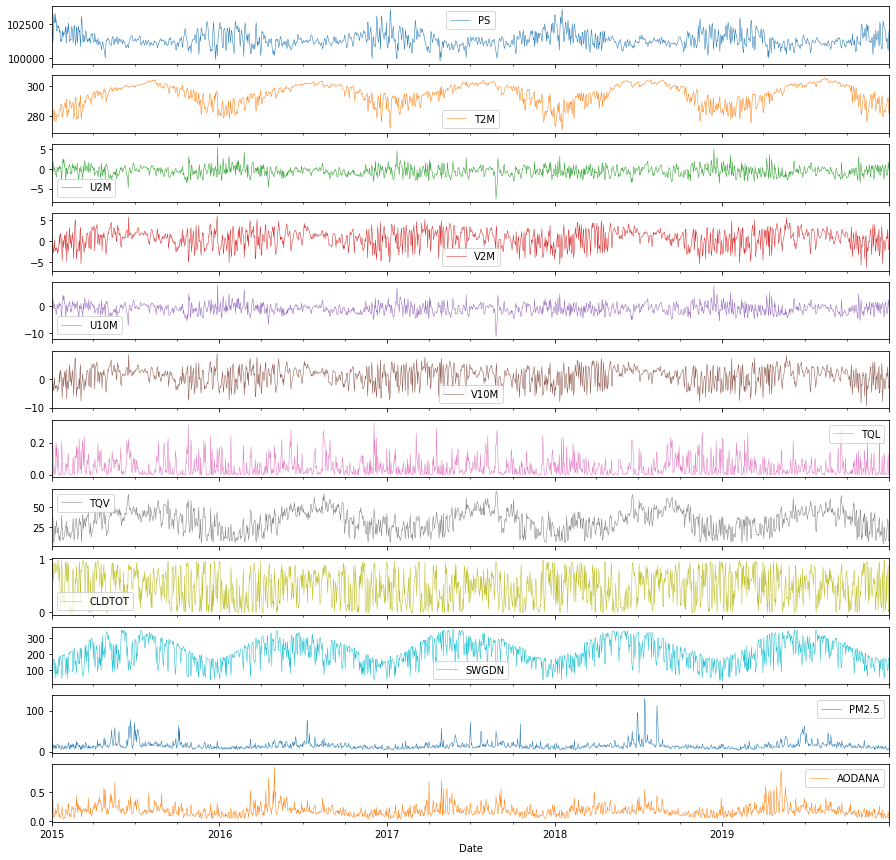

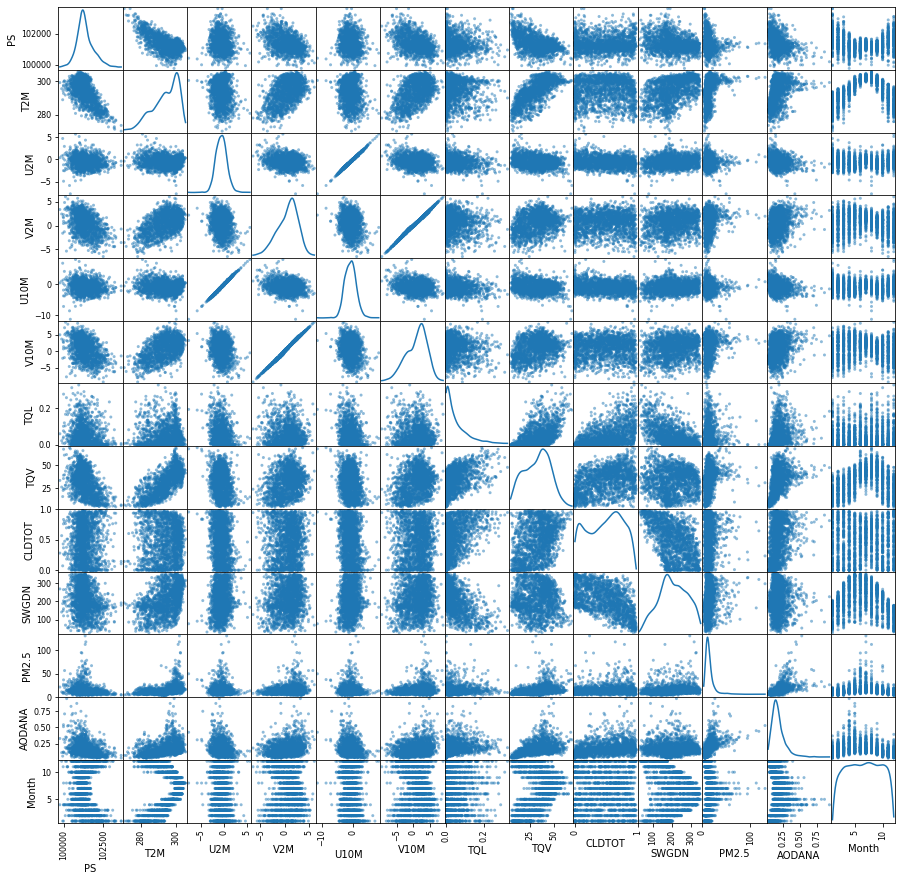

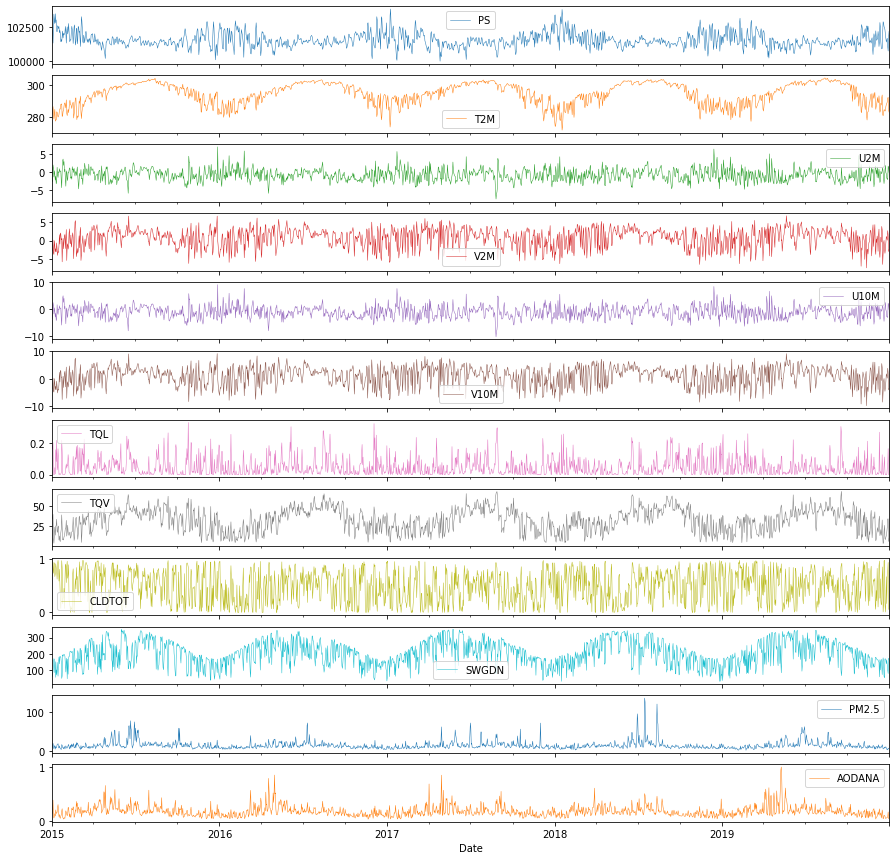

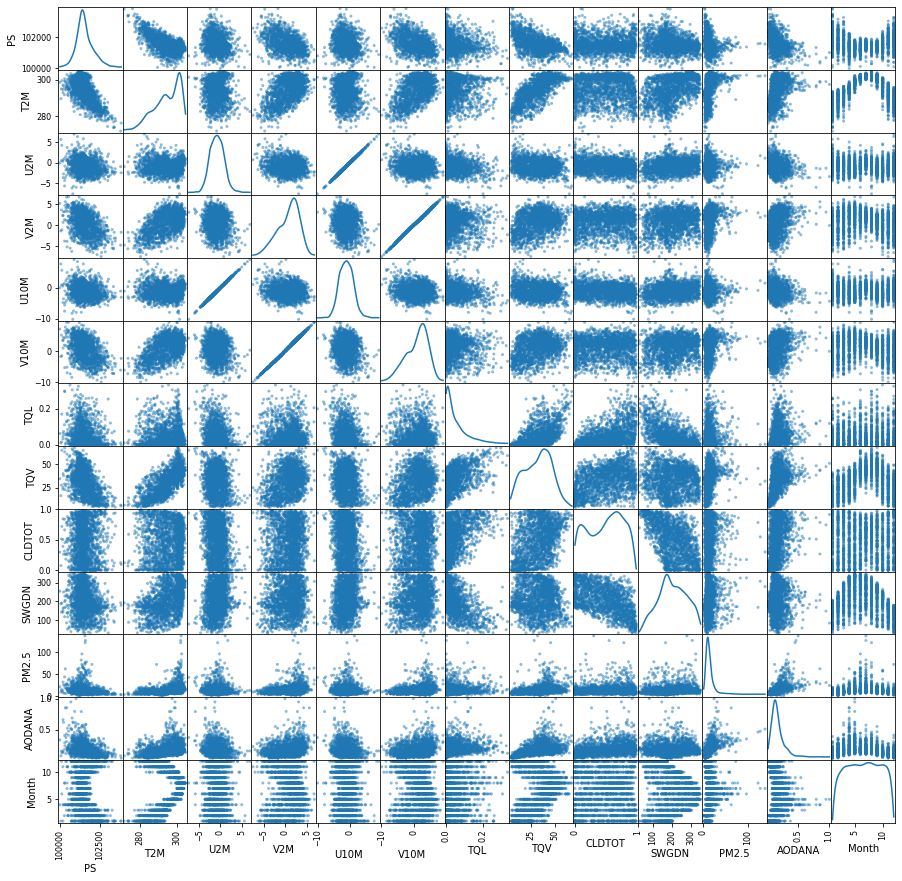

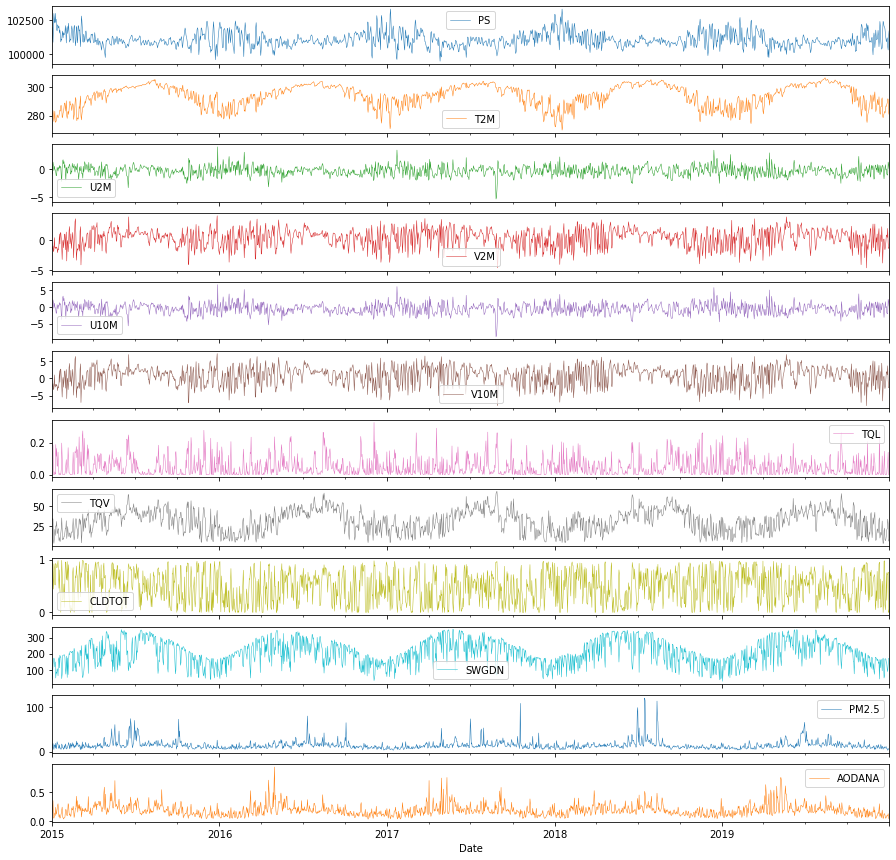

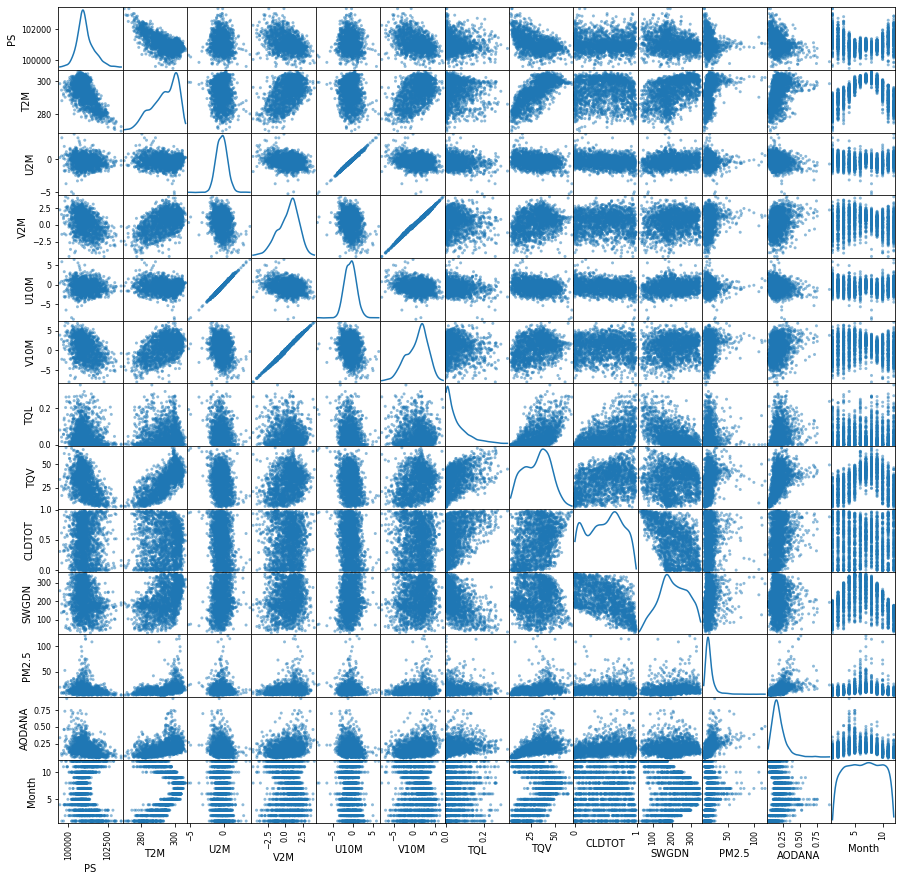

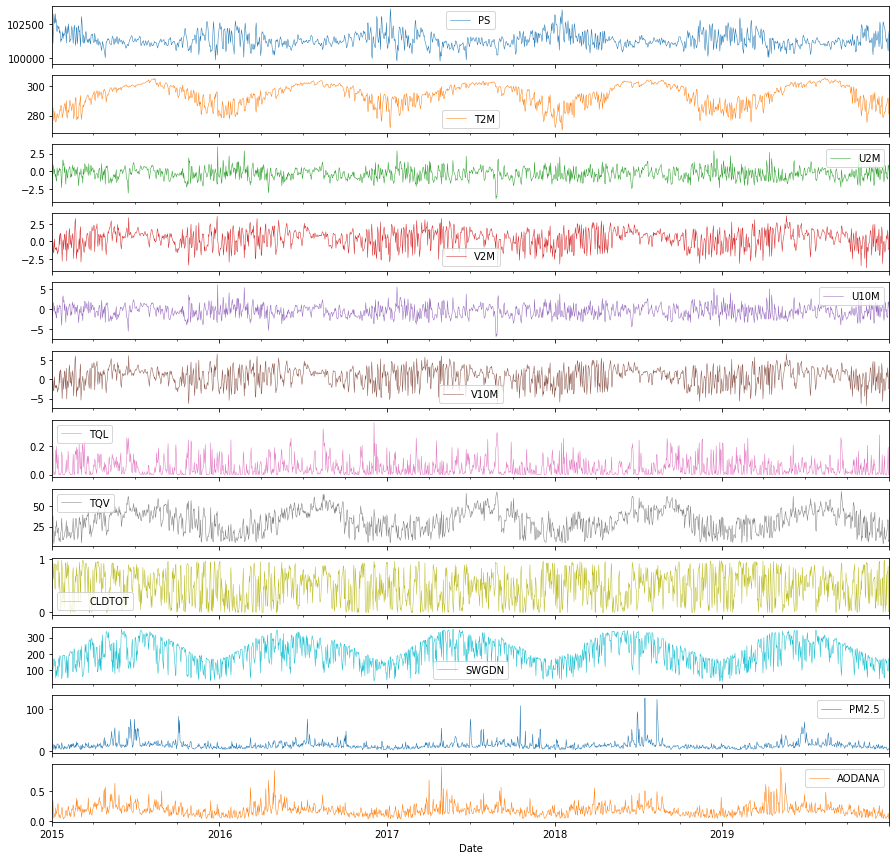

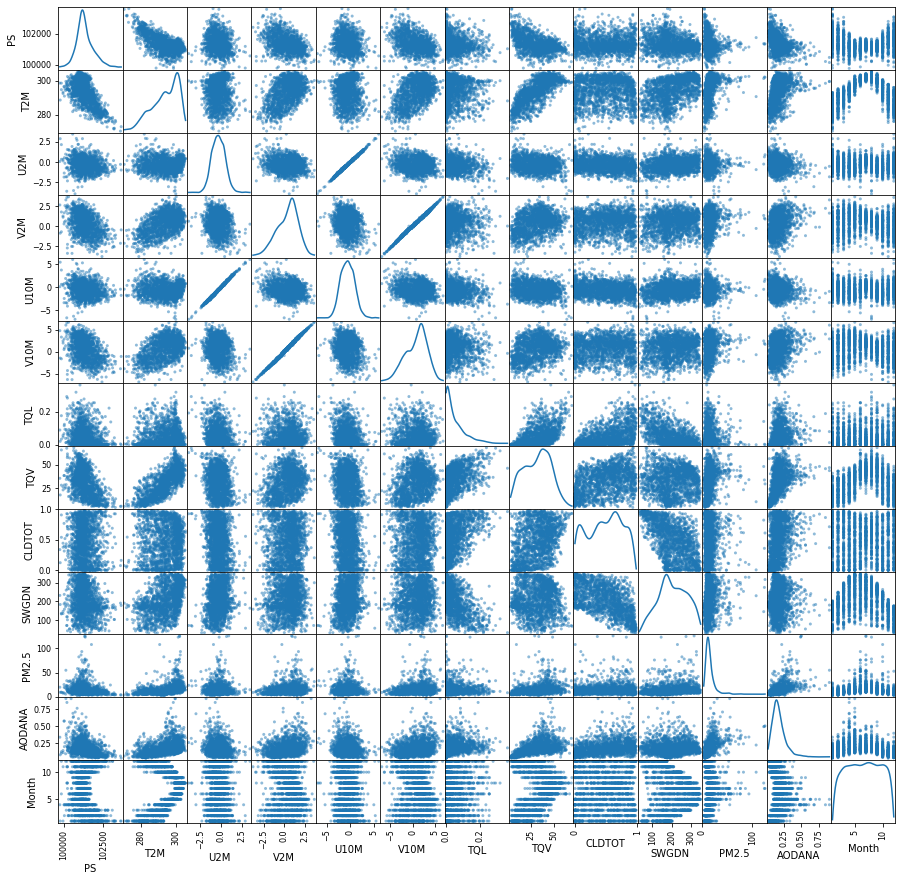

In [20]:
for group, _df in train.groupby(['lat', 'lon']):
    _df.reset_index(['lat', 'lon']).drop(['Month', 'lat', 'lon'], axis='columns').plot(subplots=True, figsize=(15, 15), lw=.5);
    scatter_matrix(_df.reset_index().drop(['lat', 'lon'], axis='columns'), alpha=.5, figsize=(15, 15), diagonal='kde');

In [21]:
import joypy
from pandas.api.types import CategoricalDtype

cat_month = CategoricalDtype(
    ['January', 'February', 'March', 'April', 'May', 'June',
     'July', 'August', 'September', 'October', 'November', 'December']
)

for group, _df in train.groupby(['lat', 'lon']):
    print(group)
#     _df.reset_index(inplace=True)
#     _df['Month'] = _df.Date.dt.month_name()
#     _df.set_index(['lat', 'lon', 'Date'], inplace=True)
#     display(_df.head(1))

#     _df['Month'] = _df['Month'].astype(cat_month)
    
#     _df.reset_index().plot(x='Date', y='T2M')
#     joypy.joyplot(
#         data = _df.reset_index(['lat', 'lon']).loc['2015'][['PM2.5', 'Month']],
#         by='Month',
#         figsize=(12, 8),
#         overlap=.1,
#         ylim="own",
#         range_style='own',
#         tails=0.2,
#         x_range=[3.837460e-09, 7.864263e-08]
#     )
#     break
    
#     _df.drop('Month', axis='columns').plot(subplots=True, figsize=(15, 15), lw=.5);
#     scatter_matrix(_df, alpha=.5, figsize=(15, 15), diagonal='kde');

(29.5, -95.625)
(29.5, -95.0)
(30.0, -95.625)
(30.0, -95.0)


In [22]:
location = []
r2 = []
rmse = []
model_type = []

models = {}
for group, _df in train.groupby(['lat', 'lon']):
    _df.reset_index(inplace=True)
    _df = _df.loc[:, ~_df.columns.isin(['lat', 'lon'])]
    _df.set_index('Date', inplace=True)
    
    _x, _y = _df.drop('PM2.5', axis=1), _df['PM2.5']
    _reg = LinearRegression().fit(_x, _y)
    _ridge = Ridge(alpha=.5).fit(_x, _y)
    _randomForest = RandomForestRegressor().fit(_x, _y)
    _adaBoost = AdaBoostRegressor().fit(_x, _y)
    
    models[str(group)] = {
        'linear': _reg,
        'ridge': _ridge,
        'randomForest': _randomForest,
        'adaBoost': _adaBoost
    }
    
    for m, name in [(_reg, 'Linear Regression'), (_ridge, 'Ridge Regression'), (_randomForest, 'Random Forest'), (_adaBoost, 'AdaBoost')]:
        y_hat = m.predict(_x)
        location.append(group)
        r2.append(m.score(_x, _y))
        rmse.append(mean_squared_error(_y, y_hat, squared=False))
        model_type.append(name)

In [23]:

results = pd.DataFrame({
    'location': location,
    'R2': r2,
    'RMSE': rmse,
    'Model': model_type,
})

display(results.set_index(['location', 'Model']))

R2      RMSE
location        Model                                
(29.5, -95.625) Linear Regression  0.377421  8.195237
                Ridge Regression   0.377068  8.197563
                Random Forest      0.951467  2.288136
                AdaBoost           0.612532  6.465207
(29.5, -95.0)   Linear Regression  0.415061  8.334342
                Ridge Regression   0.414619  8.337486
                Random Forest      0.951221  2.406746
                AdaBoost           0.608166  6.821296
(30.0, -95.625) Linear Regression  0.343387  8.377221
                Ridge Regression   0.343011  8.379621
                Random Forest      0.940754  2.516367
                AdaBoost           0.327340  8.478970
(30.0, -95.0)   Linear Regression  0.350520  8.773153
                Ridge Regression   0.350107  8.775940
                Random Forest      0.942074  2.620041
                AdaBoost           0.242145  9.476889

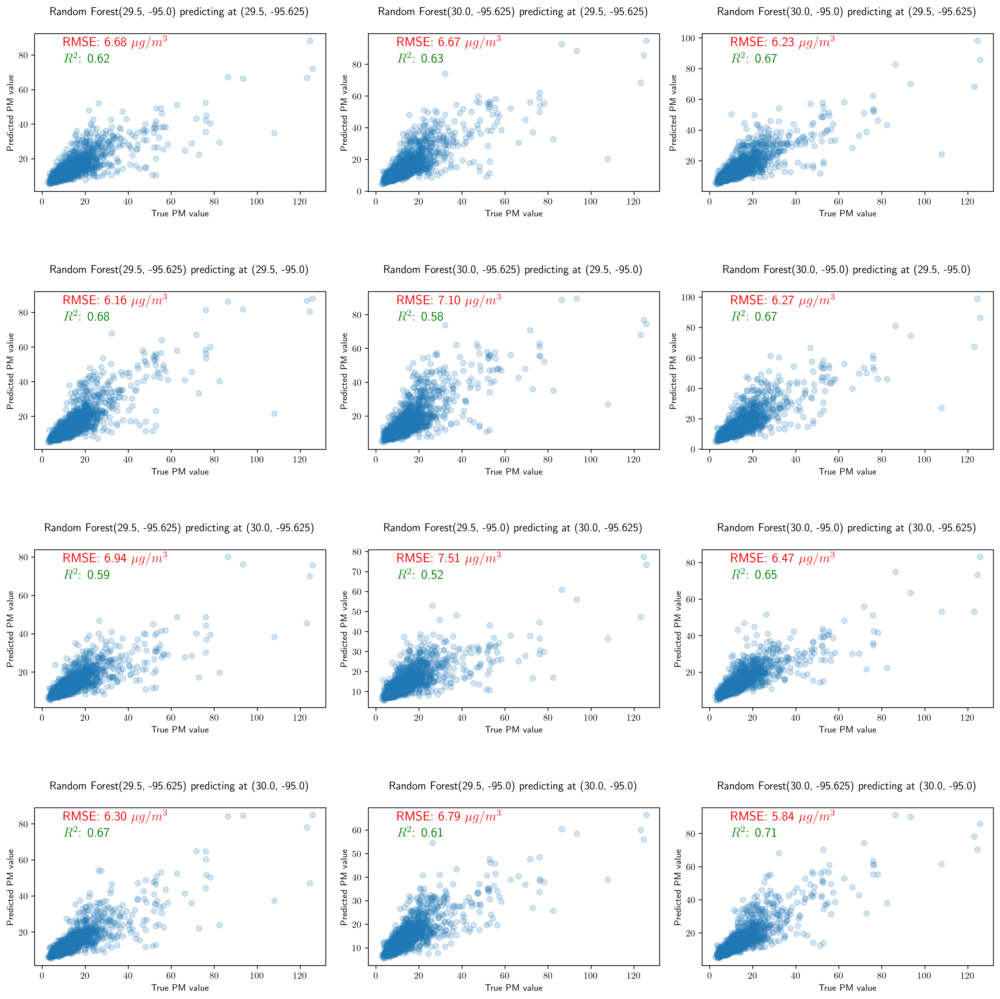

In [24]:
from matplotlib import rc
rc('text', usetex=True)

fig, axes = plt.subplots(4, 3, figsize=(15, 15), dpi=300)

for row, (data_location, data) in enumerate(train.groupby(['lat', 'lon'])):
    data.reset_index(inplace=True)
    data = data.loc[:, ~data.columns.isin(['lat', 'lon'])]
    data.set_index('Date', inplace=True)
    
    _x, _y = data.drop('PM2.5', axis=1), _df['PM2.5']
    
    # evaluate the random forest model from all other locations
    # at this location
    other_locations = [i for i in models.keys() if i != str(data_location)]
    for column, predictor_location in enumerate(other_locations):
        rf = models[predictor_location]['randomForest']
        y_hat = rf.predict(_x)
        
        _r2 = rf.score(_x, _y)
        _rmse = mean_squared_error(_y, y_hat, squared=False)

        ax = axes[row, column]
        ax.scatter(_y, y_hat, alpha=0.2)
        ax.set_xlabel('True PM value')
        ax.set_ylabel('Predicted PM value')
        ax.set_title(f'Random Forest{predictor_location} predicting at {data_location}', pad=20)
        ax.text(0.1, 0.90, f'RMSE: {_rmse:.2f}  $\mu g / m^3$',
            verticalalignment='bottom', horizontalalignment='left',
            transform=ax.transAxes,
            color='red', fontsize=14)
        ax.text(0.1, 0.80, f'$R^2$: {_r2:.2f}',
            verticalalignment='bottom', horizontalalignment='left',
            transform=ax.transAxes,
            color='green', fontsize=14)

fig.tight_layout(h_pad=5)
plt.show();

In [25]:
model_locations = []
data_locations = []
other_r2 = []
other_rmse = []
other_type = []

for data_location, data in train.groupby(['lat', 'lon']):
    data.reset_index(inplace=True)
    data = data.loc[:, ~data.columns.isin(['lat', 'lon'])]
    data.set_index('Date', inplace=True)
    
    _x, _y = data.drop('PM2.5', axis=1), _df['PM2.5']
    
    # evaluate the data at this location using the models from all other locations
    for row, (predictor_location, regressors) in enumerate(models.items()):
        if str(data_location) != predictor_location:
            for column, (regressor, model) in zip(range(4), regressors.items()):
                y_hat = model.predict(_x)
                model_locations.append(predictor_location)
                data_locations.append(str(data_location))
                other_r2.append(model.score(_x, _y))
                other_rmse.append(mean_squared_error(_y, y_hat, squared=False))
                other_type.append(regressor)

location_results = pd.DataFrame({
    'model location': model_locations,
    'data location': data_locations,
    'R2': other_r2,
    'RMSE': other_rmse,
    'Model': other_type,
})

In [26]:
location_results.set_index(['data location', 'model location', 'Model']).unstack()

R2                                   \
Model                            adaBoost    linear randomForest     ridge   
data location   model location                                               
(29.5, -95.0)   (29.5, -95.625)  0.512548  0.298621     0.680311  0.302195   
                (30.0, -95.0)    0.076442 -0.364555     0.667938 -0.247925   
                (30.0, -95.625)  0.298372  0.129166     0.575075  0.160772   
(29.5, -95.625) (29.5, -95.0)    0.400079  0.083627     0.623667  0.112377   
                (30.0, -95.0)    0.078563  0.142525     0.672651  0.171279   
                (30.0, -95.625)  0.226645  0.279813     0.625074  0.285114   
(30.0, -95.0)   (29.5, -95.0)    0.429590 -0.679719     0.610394 -0.562972   
                (29.5, -95.625)  0.491007  0.281598     0.665466  0.285386   
                (30.0, -95.625)  0.283178  0.337933     0.712146  0.336617   
(30.0, -95.625) (29.5, -95.0)    0.373609 -0.628689     0.523815 -0.524264   
                (29.5, -95.625)  0.416990  0.241457     0.594021  0.245997   
                (30.0, -95.0)    0.081262  0.298819     0.647236  0.300958   

                                      RMSE                                     
Model                             adaBoost     linear randomForest      ridge  
data location   model location                                                 
(29.5, -95.0)   (29.5, -95.625)   7.600438   9.116936     6.155115   9.093682  
                (30.0, -95.0)    10.461761  12.716519     6.273102  12.160933  
                (30.0, -95.625)   9.118557  10.158753     7.096250   9.972695  
(29.5, -95.625) (29.5, -95.0)     8.431788  10.420983     6.678194  10.256211  
                (30.0, -95.0)    10.449741  10.080530     6.228425   9.910071  
                (30.0, -95.625)   9.573311   9.238369     6.665694   9.204303  
(30.0, -95.0)   (29.5, -95.0)     8.221787  14.108830     6.794937  13.609689  
                (29.5, -95.625)   7.766558   9.226915     6.296406   9.202555  
                (30.0, -95.625)   9.216760   8.857756     5.840616   8.866552  
(30.0, -95.625) (29.5, -95.0)     8.615794  13.892862     7.512086  13.440106  
                (29.5, -95.625)   8.312100   9.481190     6.936249   9.452769  
                (30.0, -95.0)    10.434427   9.115651     6.465692   9.101737

In [27]:
location = []
r2_withpm = []
rmse_withpm = []
model_type = []

for group, _df in train.groupby(['lat', 'lon']):
    _df.reset_index(inplace=True)
    _df = _df.loc[:, ~_df.columns.isin(['lat', 'lon'])]
    _df.set_index('Date', inplace=True)
    
    _x, _y = _df, _df['PM2.5']
    _reg = LinearRegression().fit(_x, _y)
    _ridge = Ridge(alpha=0.1).fit(_x, _y)
    _randomForest = RandomForestRegressor().fit(_x, _y)
    _adaBoost = AdaBoostRegressor().fit(_x, _y)
    
    for m, name in [(_reg, 'Linear Regression'), (_ridge, 'Ridge Regression'), (_randomForest, 'Random Forest'), (_adaBoost, 'AdaBoost')]:
        y_hat = m.predict(_x)
        location.append(group)
        r2_withpm.append(m.score(_x, _y))
        rmse_withpm.append(mean_squared_error(_y, y_hat, squared=False))
        model_type.append(name)

In [28]:

results_withpm = pd.DataFrame({
    'location': location,
    'R2': r2_withpm,
    'RMSE': rmse_withpm,
    'Model': model_type,
})

display(results_withpm.set_index(['location', 'Model']))

R2          RMSE
location        Model                                    
(29.5, -95.625) Linear Regression  1.000000  3.177689e-14
                Ridge Regression   1.000000  6.662682e-06
                Random Forest      0.999318  2.711818e-01
                AdaBoost           0.983539  1.332586e+00
(29.5, -95.0)   Linear Regression  1.000000  4.327416e-14
                Ridge Regression   1.000000  6.546353e-06
                Random Forest      0.999302  2.879449e-01
                AdaBoost           0.982643  1.435670e+00
(30.0, -95.625) Linear Regression  1.000000  2.221188e-14
                Ridge Regression   1.000000  6.519936e-06
                Random Forest      0.999659  1.910218e-01
                AdaBoost           0.986360  1.207385e+00
(30.0, -95.0)   Linear Regression  1.000000  1.950501e-14
                Ridge Regression   1.000000  6.224157e-06
                Random Forest      0.998944  3.537844e-01
                AdaBoost           0.984166  1.369828e+00

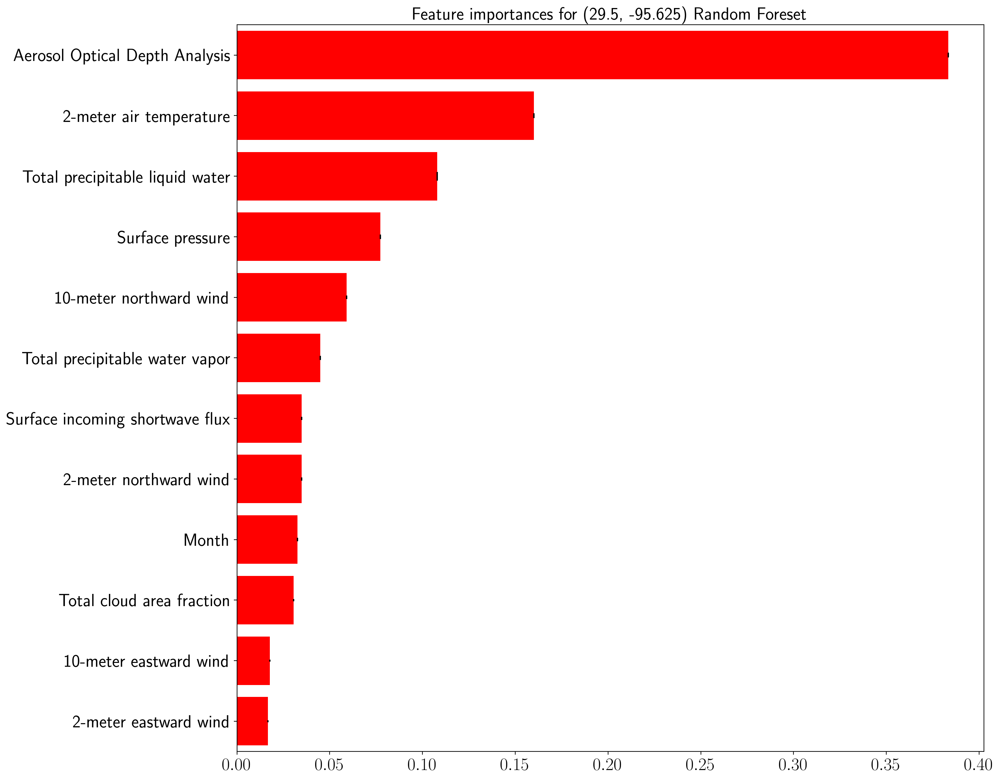

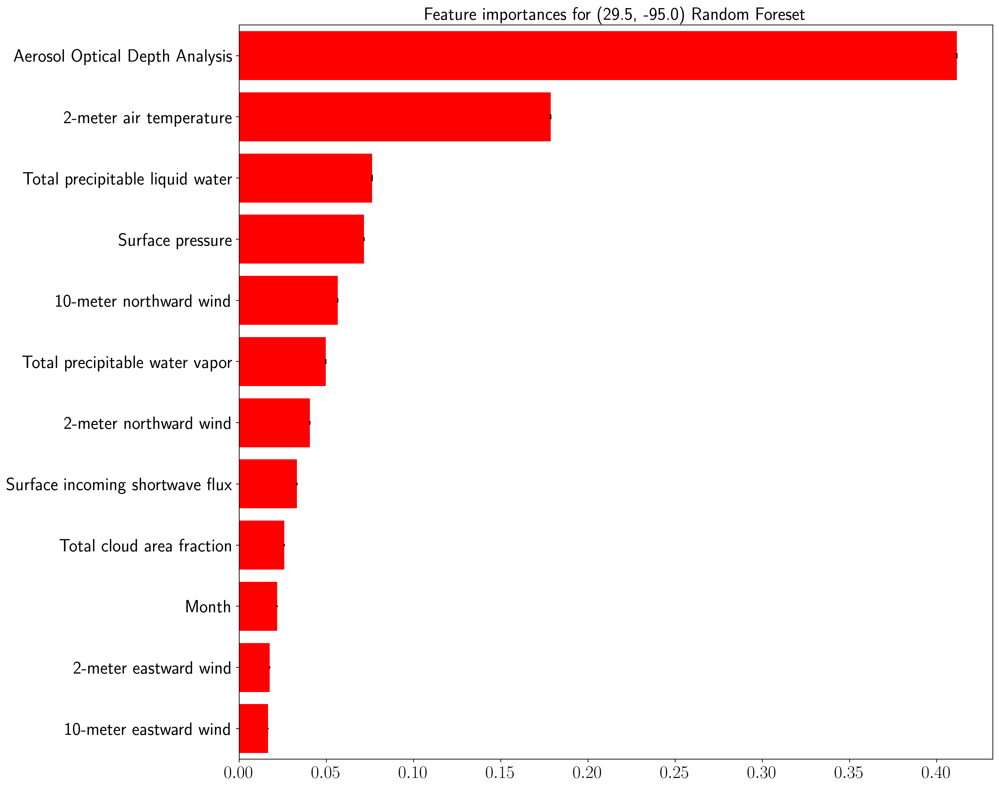

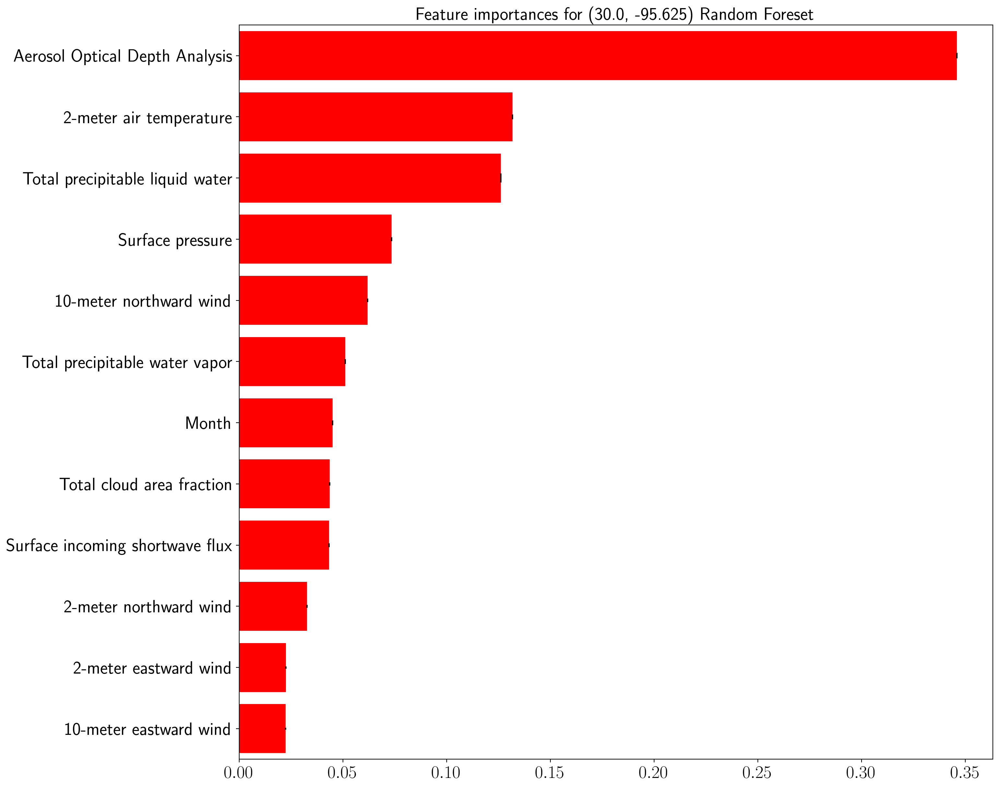

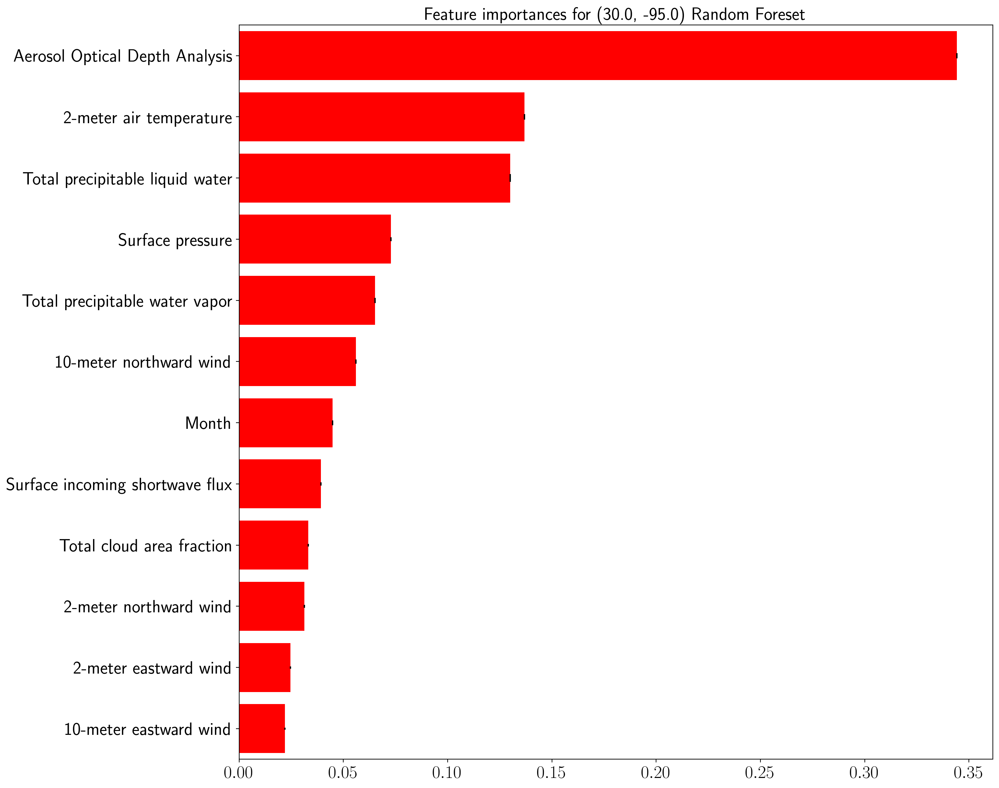

In [29]:
for location, model in models.items():
    _c = [i for i in train.columns.values if i != 'PM2.5']
    columns = np.array([translations[i] if i in translations else i for i in _c])
    
    forest = model['randomForest']
    ytick_range = range(train.shape[1] - 1)
    fontsize = 20
    
    importances = forest.feature_importances_
    std = np.std([tree.feature_importances_ for tree in forest.estimators_],
                 axis=0)
    indices = np.argsort(importances)[::]

    fig, ax = plt.subplots(figsize=(15, 15), dpi=200)
    
    ax.set_title(f"Feature importances for {location} Random Foreset", fontsize=fontsize)
    
    ax.barh(ytick_range, importances[indices],
            color="r", yerr=std[indices], align="center")
    
    ax.set_yticks(ytick_range)
    ax.set_yticklabels(columns[indices])
    ax.set_ylim([-.5, max(ytick_range)+.5])
    
    ax.tick_params(axis='x', labelsize=fontsize)
    ax.tick_params(axis='y', labelsize=fontsize)
    
    plt.show()

In [30]:
import ast
for location, model in models.items():
    location = ast.literal_eval(location)
    res = results.set_index(['location', 'Model']).loc[location].loc['Random Forest']
    r2 = res['R2']
    rmse = res['RMSE']
    print(r2, rmse)

0.9514672326310528 2.2881360217439948
0.9512214548770911 2.4067462873210803
0.940754234889899 2.516367326311535
0.9420743642254541 2.6200407778823784


In [31]:
feature_importances = {translations[i] if i in translations else i: [] for i in train.columns.values if i != 'PM2.5'}
locations = []

for location, model in models.items():
    columns = np.array([translations[i] if i in translations else i for i in feature_importances.keys()])
    locations.append(location)
    
    forest = model['randomForest']
    importances = forest.feature_importances_

    indices = np.argsort(importances)[::]
    for val, key in zip(importances[indices], columns[indices]):
        feature_importances[key].append(val)

        
feature_importances['Location'] = locations
imp_df = pd.DataFrame(feature_importances)

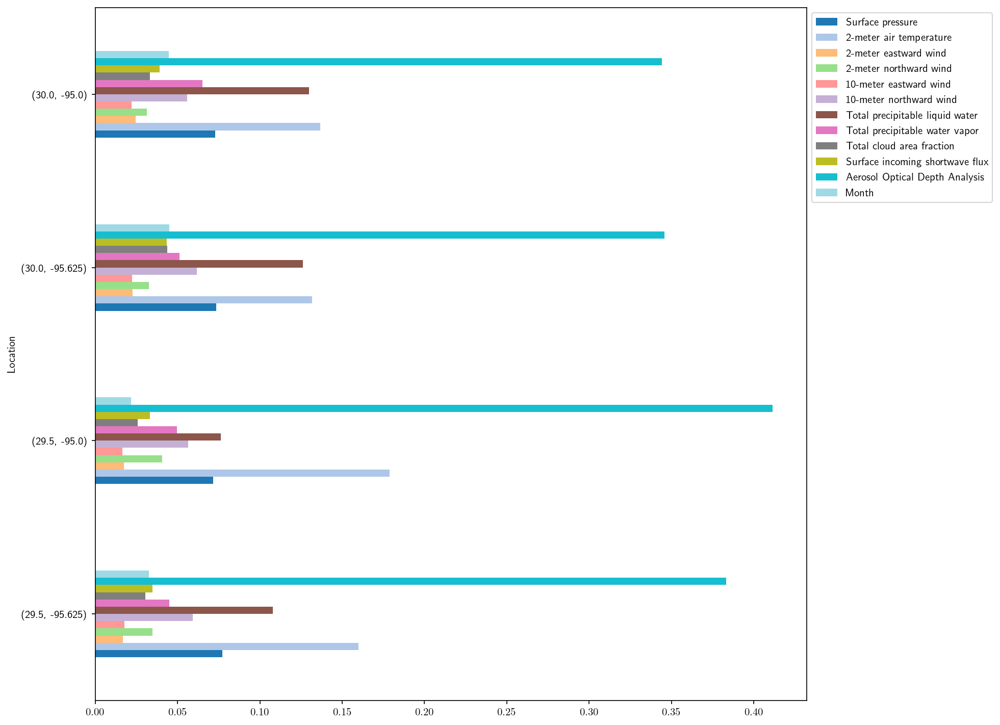

In [32]:
fig = plt.figure(dpi=150)
imp_df.set_index('Location') \
    .plot.barh(figsize=(12, 12), cmap='tab20', ax=fig.gca()) \
    .legend(bbox_to_anchor=(1,1), loc="upper left");

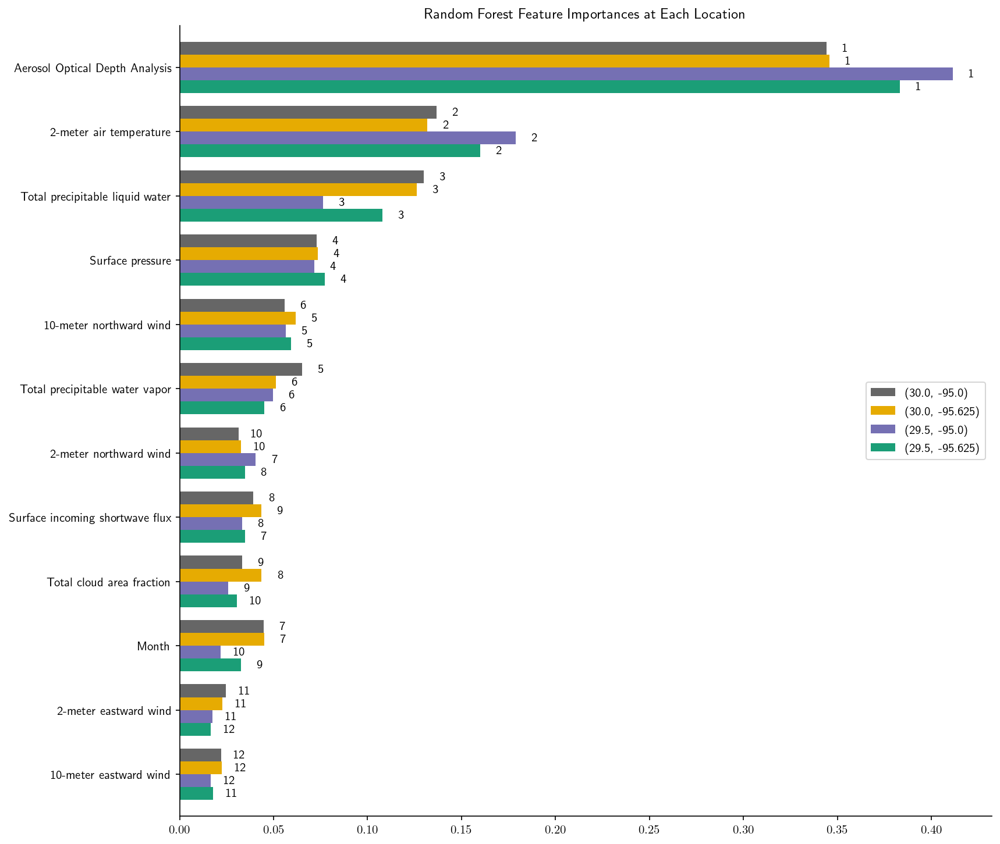

In [33]:
fig = plt.figure(dpi=150)
ax = fig.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_title('Random Forest Feature Importances at Each Location')
imp_df.set_index('Location').T.sort_values(by='(29.5, -95.0)').plot.barh(figsize=(12, 12), ax=ax, width=.8, cmap='Dark2');

handles, labels = ax.get_legend_handles_labels()
ax.legend(reversed(handles), reversed(labels),  loc='center right')

for patch in ax.patches:
    for loc, vs in imp_df.groupby('Location'):
        s = vs.set_index('Location').loc[loc].sort_values()
        close = np.isclose(s, [patch.get_width()])
        for idx, _ in enumerate(close):
            if close[idx]:
                bl = patch.get_xy()
                x = patch.get_width() + bl[0] + .01
                y = 0.5*patch.get_height() + bl[1]
                ax.text(x, y, f"{len(close) - idx}", ha='center',va='center', color='black')

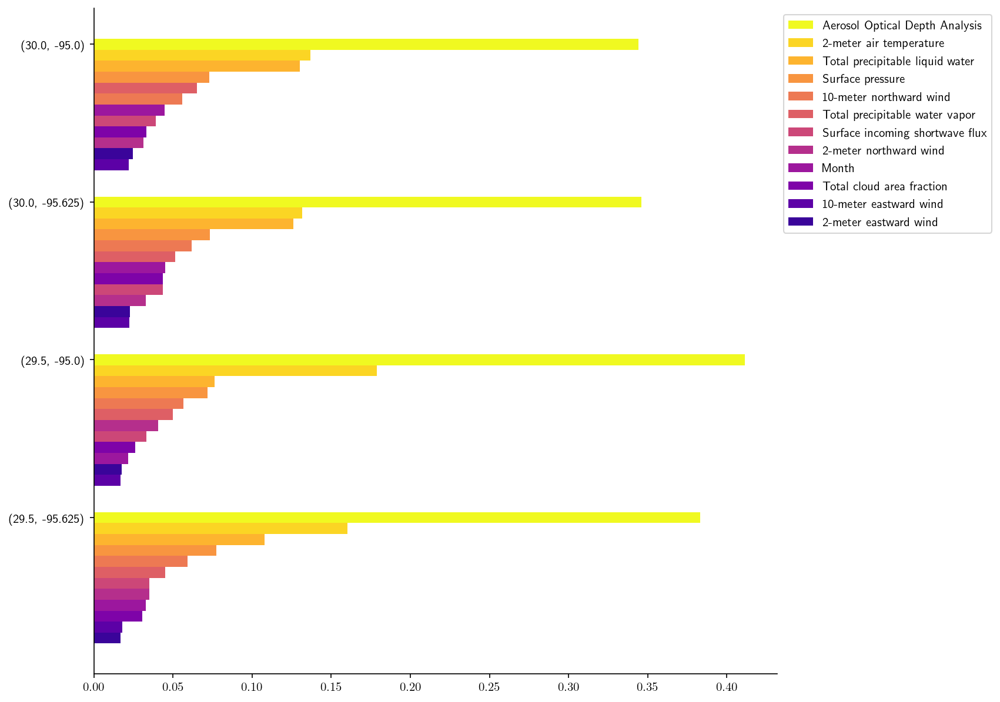

In [34]:
import matplotlib.cm as cm

nbars = imp_df.set_index('Location').columns.size
fig, ax = plt.subplots(figsize=(10, 10), dpi=150)
i = imp_df.set_index('Location')

width = 4
sep = 1.2 * width

features = {}

y_labels = []
y_ticks = []
for y, idx in enumerate(i.index):
    y = y * sep
    y_labels.append(idx)
    y_ticks.append(y)
    
    vals = i.loc[idx].sort_values(ascending=False)
    for dy, (label, val) in enumerate(vals.iteritems()):
        if label not in features:
            features[label] = []
        features[label].append((y - width/nbars*dy, val))
        
for i, (feature, values) in enumerate(features.items()):
    ys, xs = map(list, zip(*values))
    ax.barh(ys, xs, width/nbars, label=feature, color=cm.plasma(1 - float(i) / nbars))

ax.set_yticks(y_ticks)
ax.set_yticklabels(y_labels)
    
ax.legend(bbox_to_anchor=(1,1), loc="upper left")
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.show();

# 2-22 Update
   - remove ridge
   - add LASSO
   - add MAE
   - add neural network
   - start working on feature selection algorithm

In [35]:
from sklearn.linear_model import Lasso
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_absolute_error

def make_models(df):
    location = []
    r2 = []
    rmse = []
    mae = []
    model_type = []

    models = {}
    for group, _df in df.groupby(['lat', 'lon']):
        _df.reset_index(inplace=True)
        _df = _df.loc[:, ~_df.columns.isin(['lat', 'lon'])]
        _df.set_index('Date', inplace=True)

        _x, _y = _df.drop('PM2.5', axis=1), _df['PM2.5']
        _reg = LinearRegression().fit(_x, _y)
        _lasso = Lasso().fit(_x, _y)
        _randomForest = RandomForestRegressor().fit(_x, _y)
        _adaBoost = AdaBoostRegressor().fit(_x, _y)

        # neural networks are special and have to have the data with zero mean
        scaler = preprocessing.StandardScaler()
        _neural_x = _x.copy(deep=True)
        _neural_x[_neural_x.columns] = scaler.fit_transform(_x)
        
        _neural = MLPRegressor(hidden_layer_sizes=(30, 30, 30), 
                               random_state=1, activation='tanh', solver='adam',
                               max_iter=10000).fit(_neural_x, _y)

        models[str(group)] = {
            'linear': _reg,
            'lasso': _lasso,
            'randomForest': _randomForest,
            'adaBoost': _adaBoost,
            'neural': _neural
        }

        for m, name in [(_reg, 'Linear Regression'), (_lasso, 'LASSO Regression'), (_randomForest, 'Random Forest'), (_adaBoost, 'AdaBoost'), (_neural, 'Neural Network')]:
            location.append(group)
            model_type.append(name)
            if name == 'Neural Network':
                y_hat = m.predict(_neural_x)
                r2.append(m.score(_neural_x, _y))
                rmse.append(mean_squared_error(_y, y_hat, squared=False))
                mae.append(mean_absolute_error(_y, y_hat))
            else:
                y_hat = m.predict(_x)
                r2.append(m.score(_x, _y))
                rmse.append(mean_squared_error(_y, y_hat, squared=False))
                mae.append(mean_absolute_error(_y, y_hat))
    
    return models, pd.DataFrame({
        'location': location,
        'R2': r2,
        'RMSE': rmse,
        'MAE': mae,
        'Model': model_type,
    }), scaler

In [36]:
daily_models, daily_results, daily_neural_scaler = make_models(train)
display(results.set_index(['location', 'Model']))

R2      RMSE
location        Model                                
(29.5, -95.625) Linear Regression  0.377421  8.195237
                Ridge Regression   0.377068  8.197563
                Random Forest      0.951467  2.288136
                AdaBoost           0.612532  6.465207
(29.5, -95.0)   Linear Regression  0.415061  8.334342
                Ridge Regression   0.414619  8.337486
                Random Forest      0.951221  2.406746
                AdaBoost           0.608166  6.821296
(30.0, -95.625) Linear Regression  0.343387  8.377221
                Ridge Regression   0.343011  8.379621
                Random Forest      0.940754  2.516367
                AdaBoost           0.327340  8.478970
(30.0, -95.0)   Linear Regression  0.350520  8.773153
                Ridge Regression   0.350107  8.775940
                Random Forest      0.942074  2.620041
                AdaBoost           0.242145  9.476889

In [37]:
weekly = train.groupby([pd.Grouper(level='lat'), 
            pd.Grouper(level='lon'), 
            pd.Grouper(level='Date', freq='7D')]
          ).mean()
weekly_models, weekly_results, weekly_neural_scaler = make_models(weekly)
display(weekly_results.set_index(['location', 'Model']))

R2      RMSE       MAE
location        Model                                          
(29.5, -95.625) Linear Regression  0.497561  5.371210  3.517427
                LASSO Regression   0.276918  6.443532  4.040501
                Random Forest      0.956848  1.574095  1.042098
                AdaBoost           0.859430  2.841033  2.343432
                Neural Network     0.999587  0.154017  0.086722
(29.5, -95.0)   Linear Regression  0.548035  5.261326  3.503034
                LASSO Regression   0.283070  6.626455  4.196096
                Random Forest      0.953612  1.685558  1.070870
                AdaBoost           0.852605  3.004585  2.546232
                Neural Network     0.997533  0.388686  0.140657
(30.0, -95.625) Linear Regression  0.463739  5.437957  3.528481
                LASSO Regression   0.276462  6.316527  4.057542
                Random Forest      0.943795  1.760497  1.117538
                AdaBoost           0.829126  3.069633  2.540544
                Neural Network     0.997236  0.390427  0.163242
(30.0, -95.0)   Linear Regression  0.457001  5.735614  3.751770
                LASSO Regression   0.271384  6.644000  4.246148
                Random Forest      0.945590  1.815593  1.198182
                AdaBoost           0.806451  3.424334  2.960297
                Neural Network     0.998112  0.338177  0.141200

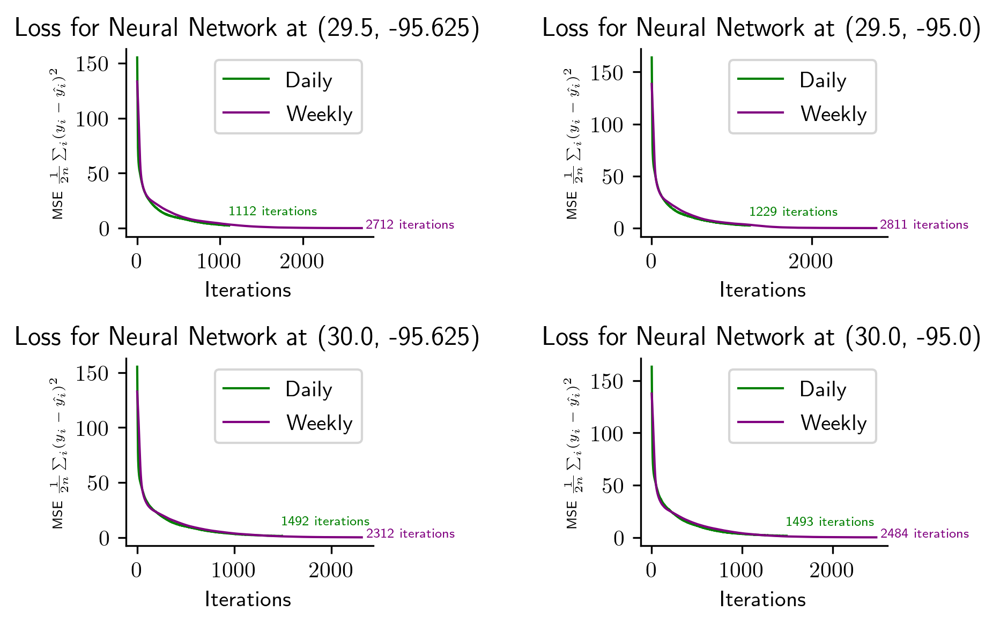

In [38]:
fig, axes = plt.subplots(2, 2, dpi=300, facecolor='white')
for ax, (loc, daily_model_collection), (_, weekly_model_collection) in zip(axes.ravel(), daily_models.items(), weekly_models.items()):
    dn = daily_model_collection['neural']
    wn = weekly_model_collection['neural']
    
    daily_loss = dn.loss_curve_
    weekly_loss = wn.loss_curve_
    
    dc = 'green'
    wc = 'purple'
    ax.plot(daily_loss, lw=1, color=dc, label='Daily')
    ax.plot(weekly_loss, lw=1, color=wc, label='Weekly')
    
    voffset = 10
    hoffset = 50
    ax.text(dn.n_iter_, daily_loss[-1] + voffset, f'{dn.n_iter_} iterations', color=dc, fontsize=6)
    ax.text(wn.n_iter_ + hoffset, weekly_loss[-1], f'{wn.n_iter_} iterations', color=wc, fontsize=6)
    
    ax.legend()
    ax.set_title(f'Loss for Neural Network at {loc}')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_xlabel('Iterations')
    ax.set_ylabel(r'MSE $\frac{1}{2n}\sum_i(y_{i} - \hat{y_{i}})^2$', fontsize=6)

plt.tight_layout(w_pad = 5)

,PC1,PC2,PC3
PS,514.864835,-2.322632,-0.181007
T2M,-4.619296,-2.504341,-3.920730
U2M,-0.118225,-0.215971,0.358312
V2M,-0.855267,-0.133017,-0.425809
U10M,-0.172237,-0.337245,0.538702
V10M,-1.281761,-0.188344,-0.645088
TQL,-0.006987,0.038727,-0.023787
TQV,-6.598430,2.106858,-10.820470
CLDTOT,0.019990,0.173221,-0.127047
SWGDN,-15.312208,-78.236125,-0.162216


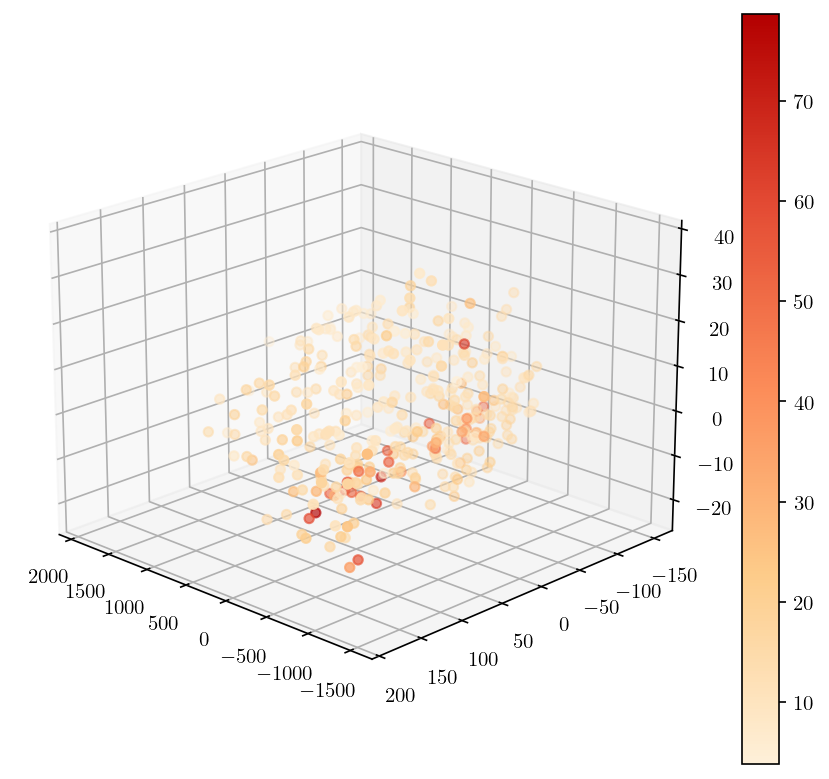

In [39]:
from matplotlib.collections import LineCollection
from sklearn import decomposition
from mpl_toolkits.mplot3d import Axes3D
from palettable import colorbrewer

for group, _df in train.groupby(['lat', 'lon']):
    _df.reset_index(inplace=True)
    _df = _df.loc[:, ~_df.columns.isin(['lat', 'lon'])]
    _df.set_index('Date', inplace=True)
    _df = _df.loc['2015']

    _x, _y = _df.drop('PM2.5', axis=1), _df['PM2.5']
    pca = decomposition.PCA(n_components=3)
    pca.fit(_x)
    X = pca.transform(_x)
    
#     var = [f'{i:.2f} %' for i in pca.explained_variance_ratio_ * 100]
#     print(var)
    loadings = pca.components_.T * np.sqrt(pca.explained_variance_)
    loading_matrix = pd.DataFrame(loadings, columns=['PC1', 'PC2', 'PC3'], index=_x.columns)
    display(loading_matrix)
    
#     fig, ax = plt.subplots(figsize=(6, 5), dpi=150)
#     bar = ax.scatter(X[:, 0], X[:, 1], c=_y, cmap=plt.cm.YlOrRd)
#     fig.colorbar(bar, ax=ax)

    
    fig = plt.figure(1, figsize=(6, 5), dpi=150)
    ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=20, azim=134)
    
    
    bar = ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=_y, cmap=colorbrewer.sequential.OrRd_5.mpl_colormap)
    fig.colorbar(bar, ax=ax)
    
#     for col in _x.columns:
#         fig, ax = plt.subplots(figsize=(6, 5))
        
#         norm = plt.Normalize(_x.min(), _x.max())
#         points = np.array([_x[col], _y]).T.reshape(-1, 1, 2)
#         segments = np.concatenate([points[:-1], points[1:]], axis=1)
#         lc = LineCollection(segments, cmap='Blues', norm=norm)
        
#         ax.set_xlim((min(_x[col]), max(_x[col])))
#         ax.set_ylim((min(_y), max(_y)))
        
#         lc.set_array(_y)
#         lc.set_linewidth(2)
        
#         line = ax.add_collection(lc)
#         fig.colorbar(line, ax=ax)
        
    break

In [40]:
[i* 100 for i in pca.explained_variance_ratio_]

[97.68023629185113, 2.2589190754048647, 0.04916103498430555]

In [41]:
pca.explained_variance_

array([2.65388751e+05, 6.13728770e+03, 1.33566279e+02])

In [42]:
np.sqrt(pca.explained_variance_)

array([515.15895745,  78.34084314,  11.55708783])

In [43]:
pca.components_

array([[ 9.99429064e-01, -8.96673959e-03, -2.29492172e-04,
        -1.66019954e-03, -3.34337173e-04, -2.48808837e-03,
        -1.35628096e-05, -1.28085329e-02,  3.88038844e-05,
        -2.97232679e-02, -4.57973457e-05, -2.12074794e-03],
       [-2.96477812e-02, -3.19672479e-02, -2.75680912e-03,
        -1.69792569e-03, -4.30484329e-03, -2.40416028e-03,
         4.94342854e-04,  2.68934840e-02,  2.21112296e-03,
        -9.98663303e-01,  2.05887216e-04,  2.73527725e-03],
       [-1.56619511e-02, -3.39248941e-01,  3.10036265e-02,
        -3.68439467e-02,  4.66122304e-02, -5.58175597e-02,
        -2.05821805e-03, -9.36262649e-01, -1.09929699e-02,
        -1.40360987e-02, -3.69309110e-03, -1.15921671e-02]])

In [44]:
pca.components_.T

array([[ 9.99429064e-01, -2.96477812e-02, -1.56619511e-02],
       [-8.96673959e-03, -3.19672479e-02, -3.39248941e-01],
       [-2.29492172e-04, -2.75680912e-03,  3.10036265e-02],
       [-1.66019954e-03, -1.69792569e-03, -3.68439467e-02],
       [-3.34337173e-04, -4.30484329e-03,  4.66122304e-02],
       [-2.48808837e-03, -2.40416028e-03, -5.58175597e-02],
       [-1.35628096e-05,  4.94342854e-04, -2.05821805e-03],
       [-1.28085329e-02,  2.68934840e-02, -9.36262649e-01],
       [ 3.88038844e-05,  2.21112296e-03, -1.09929699e-02],
       [-2.97232679e-02, -9.98663303e-01, -1.40360987e-02],
       [-4.57973457e-05,  2.05887216e-04, -3.69309110e-03],
       [-2.12074794e-03,  2.73527725e-03, -1.15921671e-02]])

In [45]:
pca.components_.T * np.sqrt(pca.explained_variance_)

array([[ 5.14864835e+02, -2.32263218e+00, -1.81006545e-01],
       [-4.61929622e+00, -2.50434116e+00, -3.92072981e+00],
       [-1.18224948e-01, -2.15970751e-01,  3.58311634e-01],
       [-8.55266666e-01, -1.33016930e-01, -4.25808728e-01],
       [-1.72236789e-01, -3.37245053e-01,  5.38701640e-01],
       [-1.28176101e+00, -1.88343943e-01, -6.45088440e-01],
       [-6.98700284e-03,  3.87272359e-02, -2.37870067e-02],
       [-6.59843046e+00,  2.10685821e+00, -1.08204697e+01],
       [ 1.99901686e-02,  1.73221237e-01, -1.27046718e-01],
       [-1.53122077e+01, -7.82361252e+01, -1.62216425e-01],
       [-2.35929129e-02,  1.61293781e-02, -4.26813782e-02],
       [-1.09252230e+00,  2.14283926e-01, -1.33971693e-01]])

# 03/03/2021

After meeting with Dr. Xu on Monday, we decided to do a few things:
- Treat each pair of input $\langle \vec{x}_t, r^t\rangle$ for each location as an independent sample and merge the data from all four locations
    - so, each day will have four input vectors
    - this means that I will only have n models rather than 4 * n models
- ensure that all errors are reported as values relative to the mean concentration of PM2.5
- add support vector regression
- decrease the complexity of the neural network
- work on and develop a feature selection algorithm
- start running cross validation

Frist up is to combine the data

In [47]:
_df = df.reset_index()
# train_filt = _df['Date'] < '2019-01-01'
# val_filt = (_df['Date'] > '2018-12-31') & (_df['Date'] < '2020-01-01')
# test_filt = _df['Date'] > '2019-12-31'

train_filt = _df['Date'] < '2016-01-01'
val_filt = (_df['Date'] > '2015-12-31') & (_df['Date'] < '2017-01-01')
test_filt = _df['Date'] > '2019-12-31'

# selected_rows = sum(map(np.sum, [train_filt, val_filt, test_filt]))
# if selected_rows != _df.shape[0]:
#     raise ValueError("Data slices don't span the entire dataset")

In [48]:
# features = ['PS', 'QV10M', 'QV2M', 'T10M', 'T2M', 'U10M', 'U2M', 'V10M', 'V2M', 'U50M', 'V50M', 'TQL', 'TQI', 'TQV', 'ALBEDO', 'CLDTOT', 'LWGAB', 'LWGEM', 'SWGDN', 'PM2.5', 'AODANA']
features = ['PS', 'T2M', 'U2M', 'V2M', 'U10M', 'V10M', 'TQL', 'TQV', 'CLDTOT', 'SWGDN', 'PM2.5', 'AODANA', 'Month']
# the PM2.5 column is a linear combination of these components. Therefore, we don't want to consider them
# check the MERRA-2 Data Formating notebook to see how these were combined
pm_components = ['DUSMASS25', 'SSSMASS25', 'BCSMASS', 'OCSMASS', 'SO4SMASS']

train = df.reset_index(['lat', 'lon', 'Date'])[train_filt] \
    .set_index('Date') \
    .drop(['lat', 'lon'] + pm_components, axis='columns') \
    .sort_index()

val = df.reset_index(['lat', 'lon', 'Date'])[val_filt] \
    .set_index('Date') \
    .drop(['lat', 'lon'] + pm_components, axis='columns') \
    .sort_index()

test = df.reset_index(['lat', 'lon', 'Date'])[test_filt] \
    .set_index('Date') \
    .drop(['lat', 'lon'] + pm_components, axis='columns') \
    .sort_index()

train['Month'] = train.index.month
val['Month'] = val.index.month
test['Month'] = test.index.month


train = train.loc[:, features].rename({i : translations[i] if i in translations else i for i in train.columns}, axis='columns')
val = val.loc[:, features].rename({i : translations[i] if i in translations else i for i in val.columns}, axis='columns')
test = test.loc[:, features].rename({i : translations[i] if i in translations else i for i in test.columns}, axis='columns')

In [49]:
display(train)
display(val)
display(test)

,Surface pressure,2-meter air temperature,2-meter eastward wind,2-meter northward wind,10-meter eastward wind,10-meter northward wind,Total precipitable liquid water,Total precipitable water vapor,Total cloud area fraction,Surface incoming shortwave flux,PM2.5,Aerosol Optical Depth Analysis,Month
Date,,,,,,,,,,,,,
2015-01-01,102206.734375,279.765778,-1.503023,-2.449461,-2.106504,-3.480748,0.178650,33.872681,0.964355,55.840008,8.259367,0.140065,1
2015-01-01,101955.406250,278.565674,-0.884811,-1.539559,-1.417902,-2.542210,0.202319,32.573849,0.961823,41.312946,7.695491,0.134578,1
2015-01-01,102225.734375,279.140472,-1.089089,-1.274900,-1.772416,-2.237665,0.198762,32.869099,0.959483,45.268208,7.260243,0.127884,1
2015-01-01,102381.406250,281.634613,-2.752680,-2.887856,-3.456308,-3.706089,0.183618,34.214149,0.967845,60.721111,8.722021,0.135506,1
2015-01-02,101544.734375,282.227631,-0.656459,-1.914652,-0.913161,-2.711771,0.174095,35.265064,0.932393,70.535767,17.585114,0.206579,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-12-30,101761.851562,284.174408,-0.833780,-2.449745,-1.249392,-3.539171,0.119750,27.163006,0.652852,95.939941,12.528724,0.217242,12
2015-12-31,102221.304688,284.747192,-2.001987,-3.899598,-2.554789,-5.035186,0.187978,32.787579,0.926432,68.855202,7.923657,0.164006,12
2015-12-31,102050.304688,283.722778,-1.406264,-2.872966,-2.003661,-4.159616,0.133926,29.052227,0.904500,78.469887,8.854658,0.141486,12


,Surface pressure,2-meter air temperature,2-meter eastward wind,2-meter northward wind,10-meter eastward wind,10-meter northward wind,Total precipitable liquid water,Total precipitable water vapor,Total cloud area fraction,Surface incoming shortwave flux,PM2.5,Aerosol Optical Depth Analysis,Month
Date,,,,,,,,,,,,,
2016-01-01,102465.312500,282.463226,-1.316944,-3.589994,-1.889460,-5.161899,0.170822,30.685148,0.939077,63.428303,7.523155,0.118332,1
2016-01-01,102214.312500,281.594330,-0.575220,-2.427844,-0.919139,-4.138746,0.151120,27.656828,0.944010,65.215904,7.136871,0.104687,1
2016-01-01,102456.984375,281.770660,-0.823202,-2.125313,-1.349604,-3.846957,0.163414,28.858000,0.947337,61.419067,7.140648,0.104068,1
2016-01-01,102628.312500,283.074860,-2.296136,-4.710680,-2.923466,-6.084629,0.182541,31.911711,0.950531,58.906494,7.694019,0.132456,1
2016-01-02,102648.179688,280.426819,-0.294853,-2.289344,-0.416312,-3.374847,0.087070,25.208294,0.961314,44.538166,8.290665,0.073030,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-30,102629.406250,283.922302,-1.252046,-1.526142,-1.782075,-2.412909,0.050197,14.486372,0.943542,92.517578,5.214952,0.091528,12
2016-12-31,101444.585938,289.382263,-0.521899,1.628213,-0.725196,2.327183,0.183540,41.571194,0.921061,33.588299,10.696401,0.204626,12
2016-12-31,101242.921875,288.165771,-0.018580,0.781296,-0.135482,1.362193,0.162622,41.034084,0.911346,41.683270,11.101233,0.220309,12


,Surface pressure,2-meter air temperature,2-meter eastward wind,2-meter northward wind,10-meter eastward wind,10-meter northward wind,Total precipitable liquid water,Total precipitable water vapor,Total cloud area fraction,Surface incoming shortwave flux,PM2.5,Aerosol Optical Depth Analysis,Month
Date,,,,,,,,,,,,,
2020-01-01,101503.273438,285.783325,-0.962916,0.604264,-1.485612,0.829112,0.083243,23.476912,0.799652,83.229980,7.120029,0.101782,1
2020-01-01,101215.609375,284.201141,-0.636717,0.343964,-1.137152,0.597211,0.075786,20.358585,0.801239,73.193520,7.094946,0.091807,1
2020-01-01,101502.609375,284.445282,-0.635476,0.251023,-1.188288,0.519791,0.070423,20.481306,0.772909,81.607178,5.931050,0.088277,1
2020-01-01,101711.273438,286.550598,-1.383122,0.655799,-1.836857,0.855046,0.076054,23.670109,0.778727,89.112343,5.938177,0.100889,1
2020-01-02,100367.796875,289.363281,0.287156,0.901410,0.352637,1.331422,0.247695,45.802021,0.902985,45.527264,8.143290,0.163304,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-30,101005.585938,292.480011,-2.473265,3.051883,-3.656015,4.463615,0.055071,26.867399,0.322722,152.449707,8.023095,0.092098,12
2020-12-31,100643.234375,291.106262,-2.688206,3.349418,-3.717329,4.551053,0.141477,36.825703,0.627627,83.622742,12.939402,0.229219,12
2020-12-31,100381.234375,291.295044,-1.423492,2.744367,-2.151637,4.009407,0.158644,36.958515,0.694194,83.547607,12.170265,0.254123,12


## Feature Extraction

When we first started, I had chosen the list of features that I selected in the cell above. I cut down the variables to a subset of that becuase the scatter matrix of the correlations was far too large for me to gain meaningful insite from. Since then, I've learned that the Perason correlation coefficient could be useful. So, I've added back all of those features.

The goal of feature extraction will be to do three things:
1. Identify colinear features
1. Identify features that are correlated with changes in PM2.5 over time
1. Decide which features to drop by
    1. dropping colinear features. 
        - However, if feature $x_i$ and feature $x_j$, $i\neqj$ are colinear, but one has an affect of PM2.5 over time, both $x_i$ and $x_j$ will be kept.
    1. This will be subject to a list of features that **must** be kept. This should be a list inspired by physical relationships that are known to exist so that the algorithm doesn't drop information that should be kept. However, if the algorithm wants to drop a feature that should be kept, then something is probably wrong.

The features resulting from that process will be used to run the 

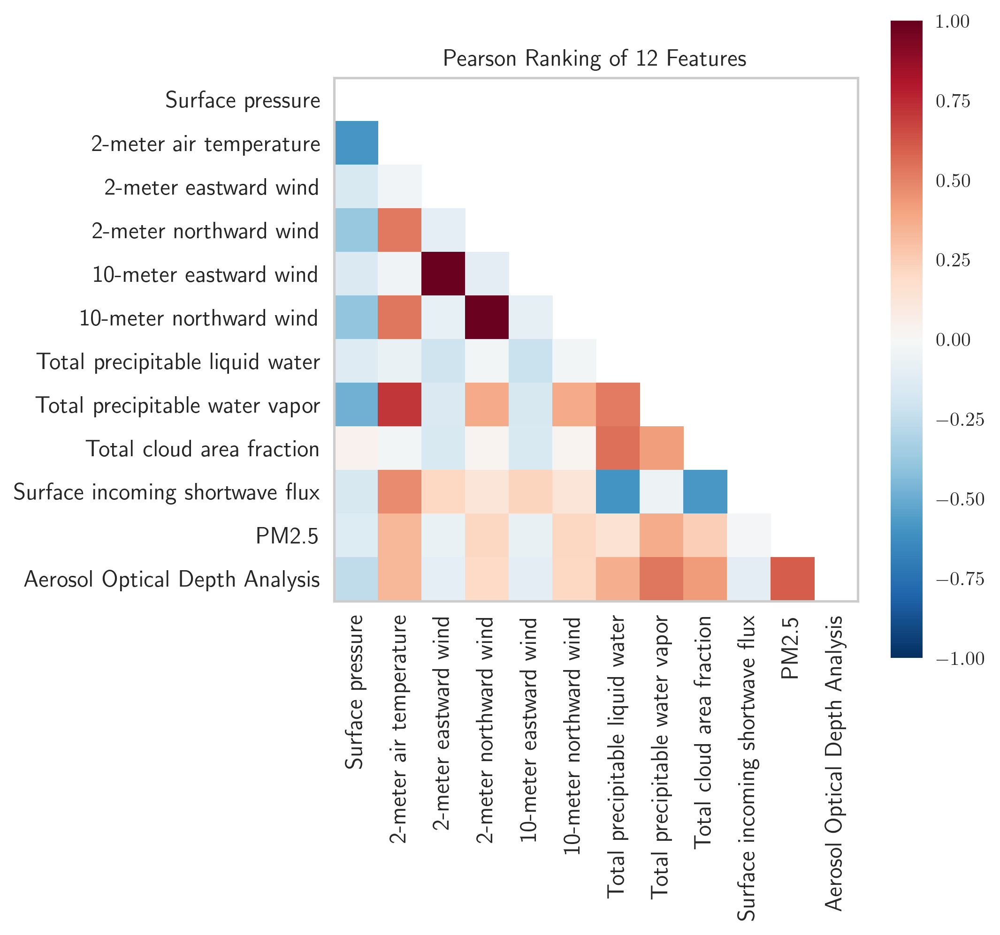

In [50]:
from yellowbrick.features import Rank2D

X_train, Y_train = train.drop('PM2.5', axis=1), train['PM2.5']

fig, ax = plt.subplots(figsize=(6, 6), dpi=300)

pearson_vars = train.drop('Month', axis=1)
visualizer = Rank2D(algorithm='pearson', ax=ax)
visualizer.fit(pearson_vars)
visualizer.transform(pearson_vars)

ax.tick_params(axis='both', which='major', labelsize=12)

visualizer.show();

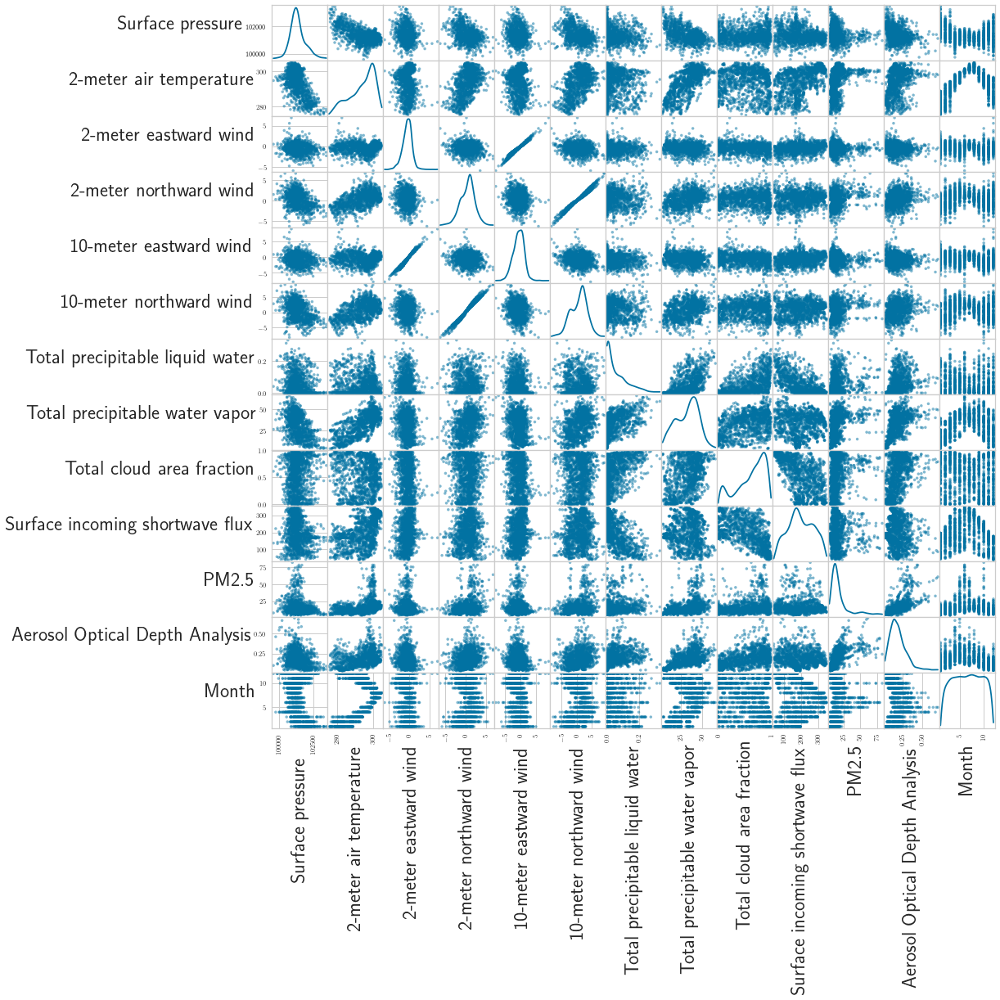

In [51]:
axes = scatter_matrix(train, alpha=.5, figsize=(15, 15), diagonal='kde')
for ax in axes.ravel():
    ax.xaxis.label.set_rotation(90)
    ax.yaxis.label.set_rotation(0)
    ax.yaxis.label.set_ha('right')

plt.tight_layout()
plt.gcf().subplots_adjust(wspace=0, hspace=0)
# plt.savefig('/Users/kyle/Desktop/scatter.png', dpi=300)
[plt.setp(item.yaxis.get_label(), 'size', 24) for item in axes.ravel()]
[plt.setp(item.xaxis.get_label(), 'size', 24) for item in axes.ravel()]

plt.show();

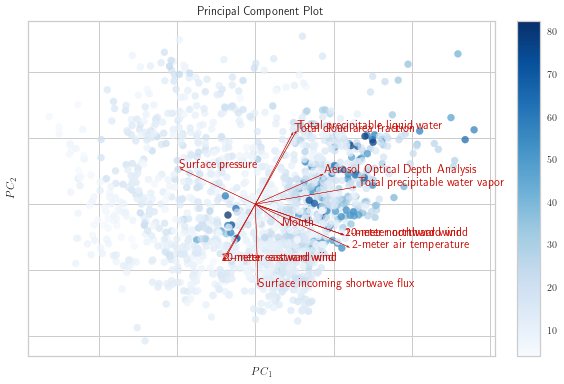

In [52]:
from yellowbrick.features import PCA

visualizer = PCA(scale=True, proj_features=True, projection=2, colormap='Blues')
visualizer.fit_transform(X_train, Y_train)
visualizer.show();

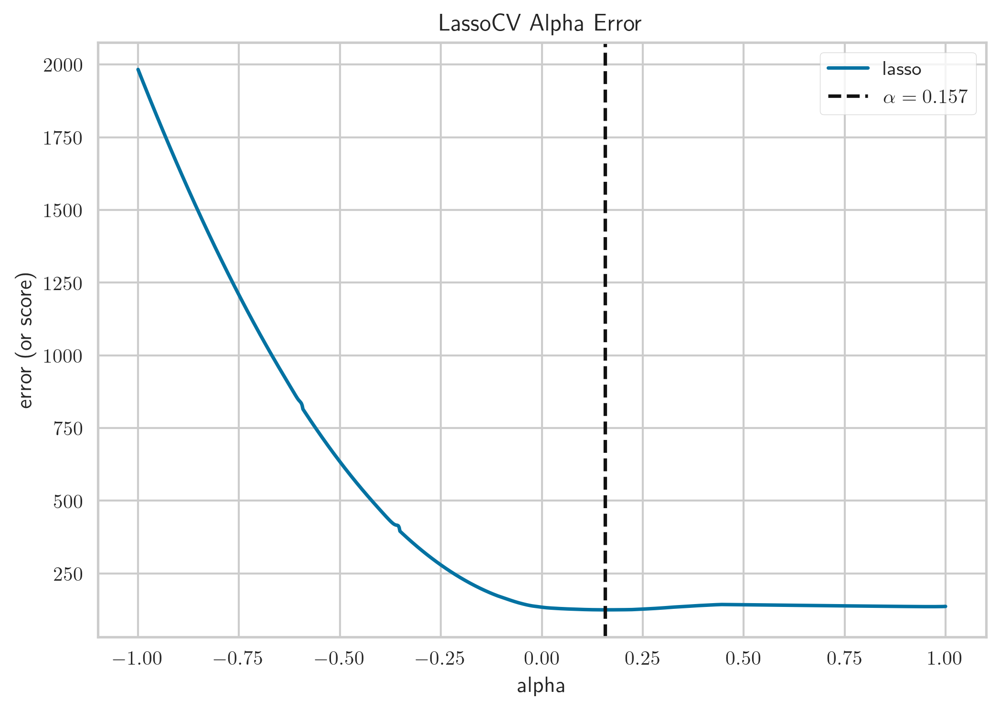

In [53]:
from sklearn.linear_model import LassoCV
from yellowbrick.regressor import AlphaSelection

fig, ax = plt.subplots(dpi=300)
# Create a list of alphas to cross-validate against
alphas = np.linspace(-1, 1, 1000)

# Instantiate the linear model and visualizer
optimal_lasso = LassoCV(alphas=alphas, max_iter=10000, tol=1, n_jobs=-1)
visualizer = AlphaSelection(optimal_lasso, ax=ax)
visualizer.fit(X_train, Y_train)
visualizer.show();

In [57]:
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV

from warnings import simplefilter
from sklearn.exceptions import ConvergenceWarning
simplefilter("ignore", category=ConvergenceWarning)

sfs = SequentialFeatureSelector(optimal_lasso, n_features_to_select=10, direction='forward', cv=10, n_jobs=-1).fit(X_train, Y_train)

neural_param_grid = [
    {
        'regressor__hidden_layer_sizes': [
#                                           (10), (20), (30), 
#                                           (10, 10), (10, 20), (10, 30), (20, 30), (30, 30), 
#                                           (10, 10, 10), (10, 10, 20), (10, 10, 30), 
#                                           (10, 20, 10), (10, 20, 20), (10, 20, 30),
#                                           (10, 30, 10), (10, 30, 20), (10, 30, 30),
#                                           (20, 10, 10), (20, 10, 20), (20, 10, 30), 
#                                           (20, 20, 10), (20, 20, 20), (20, 20, 30),
#                                           (20, 30, 10), (20, 30, 20), (20, 30, 30),
#                                           (30, 10, 10), (30, 10, 20), (30, 10, 30), 
#                                           (30, 20, 10), (30, 20, 20), (30, 20, 30),
#                                           (30, 30, 10), (30, 30, 20), (30, 30, 30)
                                            (10, 10, 10)#, (20, 20, 20), (30, 30, 30)
                                         ]
    },
]

pipelines = { 
    'Linear Regression' : 
             Pipeline([
              ('feature_selection', sfs), 
              ('regressor', LinearRegression())
            ]),
    'Random Forest' : 
             Pipeline([
              ('feature_selection', sfs),
              ('regressor', RandomForestRegressor(n_jobs=-1))
            ]),
    'Ada Boost' : 
             Pipeline([
              ('feature_selection', sfs), 
              ('regressor', AdaBoostRegressor())
            ]),
    'SVR' : 
             Pipeline([
              ('feature_selection', sfs), 
              ('regressor', SVR())
            ]),
    'Neural Network' : 
                 Pipeline([
              ('feature_selection', sfs), 
              ('scalar', preprocessing.StandardScaler()),
              ('regressor', MLPRegressor(activation='tanh', 
                                         solver='adam',
                                         max_iter=2000))
            ])
}


pm_avg = Y_train.mean()
for model_name, pipeline in pipelines.items():
    if model_name == 'Neural Network':
        grid = GridSearchCV(pipeline, cv=10, n_jobs=-1, param_grid=neural_param_grid)
        grid.fit(X_train, Y_train)
    else:
        pipeline.fit(X_train, Y_train)

KeyboardInterrupt: 

In [ ]:
print('Selected features:')
for i in X_train.columns[sfs.get_support()]:
    print(f'\t{i}')

print('Neural network selected hidden layers')
print(grid.best_params_)

In [ ]:
pm_avg = Y_train.mean()

r2s = []
rmses = []
maes = []
models = []

X_val, Y_val = val.drop('PM2.5', axis=1), val['PM2.5']

for model_name, pipeline in pipelines.items():
    if model_name == 'neural_network':
        y_hat = grid.predict(val)
        r2 = grid.score(X_val, Y_val)
    else:
        y_hat = pipeline.predict(reduced)    
        r2 = pipeline.score(X_val, Y_val)
        
    rmse = mean_squared_error(Y_val, y_hat, squared=False) / pm_avg
    mae = mean_absolute_error(Y_val, y_hat) / pm_avg
    
    models.append(model_name)
    r2s.append(round(r2, 3))
    maes.append(round(mae, 3))
    rmses.append(round(rmse, 3))
    
res = pd.DataFrame({'r2': r2s, 'rmse': rmses, 'mae': maes, 'model': models})

In [ ]:
res.set_index('model')